In this notebook, we cluster the cells based on their scar profile using IWSS.

# Import all relevant packages

In [1]:
#import all 
%matplotlib inline
import matplotlib
import sys, os
from pandas.io.parsers import read_csv
import numpy as np
import seaborn as sns
import pandas as pd
import sklearn.cluster as cluster
import matplotlib.pyplot as plt
import collections
import scipy
import itertools

import scanpy as sc
dpi = 50
sc.set_figure_params(dpi=dpi, color_map = 'viridis')

# Load computed datasets

#### Here you can load all precomputed datasets.

In [2]:
pathToData = '/Users/m.blotenburg/Documents/Projects/Mouse_Scartrace/Data_analysis/Scar_analysis/20200511_AllScarData_Remapped_MaskedRef_alteredAlleles/120hAA_VAN2988_SQ98/dataframes/'

In [3]:
df = pd.read_pickle(pathToData + '120hAA_miseq_remapped_filtered.pickle.gz')
df.head()

gastruloid                           C5A9                                    \
cell                                 A2_1 A2_10 A2_100 A2_101 A2_102 A2_103   
chrom allele site      scar                                                   
1     None   12847807  WT             NaN   NaN    NaN    NaN    NaN    NaN   
             12847810  WT             NaN   NaN    NaN    NaN    NaN    NaN   
             12847812  WT             NaN   NaN    NaN    NaN    NaN    NaN   
             143473230 143473407.D    NaN   NaN    NaN    NaN    NaN    NaN   
             143473231 T.143473171.I  NaN   NaN    NaN    NaN    NaN    NaN   

gastruloid                                                        ... C5F10  \
cell                                 A2_104 A2_105 A2_106 A2_107  ... H2_90   
chrom allele site      scar                                       ...         
1     None   12847807  WT               NaN    NaN    NaN    NaN  ...   NaN   
             12847810  WT               NaN    NaN    NaN    NaN  ...   NaN   
             12847812  WT               NaN    NaN    NaN    NaN  ...   NaN   
             143473230 143473407.D      NaN    NaN    NaN    NaN  ...   NaN   
             143473231 T.143473171.I    NaN    NaN    NaN    NaN  ...   NaN   

gastruloid                                                                \
cell                                 H2_91 H2_92 H2_93 H2_94 H2_95 H2_96   
chrom allele site      scar                                                
1     None   12847807  WT              NaN   NaN   NaN   NaN   NaN   NaN   
             12847810  WT              NaN   NaN   NaN   NaN   NaN   NaN   
             12847812  WT              NaN   NaN   NaN   NaN   NaN   NaN   
             143473230 143473407.D     NaN   NaN   NaN   NaN   NaN   NaN   
             143473231 T.143473171.I   NaN   NaN   NaN   NaN   NaN   NaN   

gastruloid                                              
cell                                 H2_97 H2_98 H2_99  
chrom allele site      scar                             
1     None   12847807  WT              NaN   NaN   NaN  
             12847810  WT              NaN   NaN   NaN  
             12847812  WT              NaN   NaN   NaN  
             143473230 143473407.D     NaN   NaN   NaN  
             143473231 T.143473171.I   NaN   NaN   NaN  

[5 rows x 3063 columns]

In [4]:
sf = df.loc['12']

sf_129 = sf.loc['129S1_SvImJ']
sf_B6 = sf.loc['C57BL_6NJ']

sf_nonallelic = sf.loc['None']



In [5]:
#to load dataframes containing all calculated percentages again
percentagesChr12_129 = pd.read_pickle(pathToData + '120hAA_dataFramepercentagesChr12_129_filtered.pickle.gz')
percentagesChr12_B6 = pd.read_pickle(pathToData + '120hAA_dataFramepercentagesChr12_B6_filtered.pickle.gz')
percentagesChr12_NA = pd.read_pickle(pathToData + '120hAA_dataFramepercentagesChr12_NA_filtered.pickle.gz')

In [6]:
#to load dataframes containing all allele counts again
alleleCountsChr12_129PD = pd.read_pickle(pathToData + '120hAA_dataFrameAlleleCountsChr12_129_filtered.pickle.gz')
alleleCountsChr12_B6PD = pd.read_pickle(pathToData + '120hAA_dataFrameAlleleCountsChr12_B6_filtered.pickle.gz')
alleleCountsChr12_NAPD = pd.read_pickle(pathToData + '120hAA_dataFrameAlleleCountsChr12_NA_filtered.pickle.gz')

In [7]:
#to load dataframes for distance calculation again
all_allelecounts_fordistancecalc = pd.read_pickle(pathToData + '120hAA_all_allelecounts_fordistancecalc_filtered.pickle.gz')
allelecountsNA_ts = pd.read_pickle(pathToData + '120hAA_allelecountsNA_ts_filtered.pickle.gz')
allelecountsB6_ts = pd.read_pickle(pathToData + '120hAA_allelecountsB6_ts_filtered.pickle.gz')
allelecounts129_ts = pd.read_pickle(pathToData + '120hAA_allelecounts129_ts_filtered.pickle.gz')

In [8]:
#to load dataframes for Buys' heatmap calculation again
heatmap_129 = pd.read_pickle(pathToData + '120hAA_dataframeForHeatmap_All_129_filtered.pickle.gz')
heatmap_129.index.names = ['gastruloid', 'cell']
heatmap_B6 = pd.read_pickle(pathToData + '120hAA_dataframeForHeatmap_All_B6_filtered.pickle.gz')
heatmap_B6.index.names = ['gastruloid', 'cell']
heatmap_NA = pd.read_pickle(pathToData + '120hAA_dataframeForHeatmap_All_nonallelic_filtered.pickle.gz')
heatmap_NA.index.names = ['gastruloid', 'cell']

heatmap = pd.read_pickle(pathToData + '120hAA_dataframeForHeatmap_All_filtered.pickle.gz')
heatmap.index.names = ['gastruloid', 'cell']

In [9]:
cols=["black", "#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#006FA6", "#A30059", "#FFDBE5", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87","#5A0007", "#809693", "#FEFFE6", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80","#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100", "#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F", "#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09","#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66","#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C","#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81","#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00","#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700","#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329","#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C","#83AB58", "#001C1E", "#D1F7CE", "#004B28", "#C8D0F6", "#A3A489", "#806C66", "#222800","#BF5650", "#E83000", "#66796D", "#DA007C", "#FF1A59", "#8ADBB4", "#1E0200", "#5B4E51","#C895C5", "#320033", "#FF6832", "#66E1D3", "#CFCDAC", "#D0AC94", "#7ED379", "#012C58","#7A7BFF", "#D68E01", "#353339", "#78AFA1", "#FEB2C6", "#75797C", "#837393", "#943A4D","#B5F4FF", "#D2DCD5", "#9556BD", "#6A714A", "#001325", "#02525F", "#0AA3F7", "#E98176","#DBD5DD", "#5EBCD1", "#3D4F44", "#7E6405", "#02684E", "#962B75", "#8D8546", "#9695C5","#E773CE", "#D86A78", "#3E89BE", "#CA834E", "#518A87", "#5B113C", "#55813B", "#E704C4","#00005F", "#A97399", "#4B8160", "#59738A", "#FF5DA7", "#F7C9BF", "#643127", "#513A01","#6B94AA", "#51A058", "#A45B02", "#1D1702", "#E20027", "#E7AB63", "#4C6001", "#9C6966","#64547B", "#97979E", "#006A66", "#391406", "#F4D749", "#0045D2", "#006C31", "#DDB6D0","#7C6571", "#9FB2A4", "#00D891", "#15A08A", "#BC65E9", "#FFFFFE", "#C6DC99", "#203B3C","#671190", "#6B3A64", "#F5E1FF", "#FFA0F2", "#CCAA35", "#374527", "#8BB400", "#797868","#C6005A", "#3B000A", "#C86240", "#29607C", "#402334", "#7D5A44", "#CCB87C", "#B88183","#AA5199", "#B5D6C3", "#A38469", "#9F94F0", "#A74571", "#B894A6", "#71BB8C", "#00B433","#789EC9", "#6D80BA", "#953F00", "#5EFF03", "#E4FFFC", "#1BE177", "#BCB1E5", "#76912F","#003109", "#0060CD", "#D20096", "#895563", "#29201D", "#5B3213", "#A76F42", "#89412E","#1A3A2A", "#494B5A", "#A88C85", "#F4ABAA", "#A3F3AB", "#00C6C8", "#EA8B66", "#958A9F","#BDC9D2", "#9FA064", "#BE4700", "#658188", "#83A485", "#453C23", "#47675D", "#3A3F00","#061203", "#DFFB71", "#868E7E", "#98D058", "#6C8F7D", "#D7BFC2", "#3C3E6E", "#D83D66","#2F5D9B", "#6C5E46", "#D25B88", "#5B656C", "#00B57F", "#545C46", "#866097", "#365D25","#252F99", "#00CCFF", "#674E60", "#FC009C", "#92896B", "#1E2324", "#DEC9B2", "#9D4948","#85ABB4", "#342142", "#D09685", "#A4ACAC", "#00FFFF", "#AE9C86", "#742A33", "#0E72C5","#AFD8EC", "#C064B9", "#91028C", "#FEEDBF", "#FFB789", "#9CB8E4", "#AFFFD1", "#2A364C","#4F4A43", "#647095", "#34BBFF", "#807781", "#920003", "#B3A5A7", "#018615", "#F1FFC8","#976F5C", "#FF3BC1", "#FF5F6B", "#077D84", "#F56D93", "#5771DA", "#4E1E2A", "#830055","#02D346", "#BE452D", "#00905E", "#BE0028", "#6E96E3", "#007699", "#FEC96D", "#9C6A7D","#3FA1B8", "#893DE3", "#79B4D6", "#7FD4D9", "#6751BB", "#B28D2D", "#E27A05", "#DD9CB8","#AABC7A", "#980034", "#561A02", "#8F7F00", "#635000", "#CD7DAE", "#8A5E2D", "#FFB3E1","#6B6466", "#C6D300", "#0100E2", "#88EC69", "#8FCCBE", "#21001C", "#511F4D", "#E3F6E3","#FF8EB1", "#6B4F29", "#A37F46", "#6A5950", "#1F2A1A", "#04784D", "#101835", "#E6E0D0","#FF74FE", "#00A45F", "#8F5DF8", "#4B0059", "#412F23", "#D8939E", "#DB9D72", "#604143","#B5BACE", "#989EB7", "#D2C4DB", "#A587AF", "#77D796", "#7F8C94", "#FF9B03", "#555196","#31DDAE", "#74B671", "#802647", "#2A373F", "#014A68", "#696628", "#4C7B6D", "#002C27","#7A4522", "#3B5859", "#E5D381", "#FFF3FF", "#679FA0", "#261300", "#2C5742", "#9131AF","#AF5D88", "#C7706A", "#61AB1F", "#8CF2D4", "#C5D9B8", "#9FFFFB", "#BF45CC", "#493941","#863B60", "#B90076", "#003177", "#C582D2", "#C1B394", "#602B70", "#887868", "#BABFB0","#030012", "#D1ACFE", "#7FDEFE", "#4B5C71", "#A3A097", "#E66D53", "#637B5D", "#92BEA5","#00F8B3", "#BEDDFF", "#3DB5A7", "#DD3248", "#B6E4DE", "#427745", "#598C5A", "#B94C59","#8181D5", "#94888B", "#FED6BD", "#536D31", "#6EFF92", "#E4E8FF", "#20E200", "#FFD0F2","#4C83A1", "#BD7322", "#915C4E", "#8C4787", "#025117", "#A2AA45", "#2D1B21", "#A9DDB0","#FF4F78", "#528500", "#009A2E", "#17FCE4", "#71555A", "#525D82", "#00195A", "#967874","#555558", "#0B212C", "#1E202B", "#EFBFC4", "#6F9755", "#6F7586", "#501D1D", "#372D00","#741D16", "#5EB393", "#B5B400", "#DD4A38", "#363DFF", "#AD6552", "#6635AF", "#836BBA","#98AA7F", "#464836", "#322C3E", "#7CB9BA", "#5B6965", "#707D3D", "#7A001D", "#6E4636","#443A38", "#AE81FF", "#489079", "#897334", "#009087", "#DA713C", "#361618", "#FF6F01","#006679", "#370E77", "#4B3A83", "#C9E2E6", "#C44170", "#FF4526", "#73BE54", "#C4DF72","#ADFF60", "#00447D", "#DCCEC9", "#BD9479", "#656E5B", "#EC5200", "#FF6EC2", "#7A617E","#DDAEA2", "#77837F", "#A53327", "#608EFF", "#B599D7", "#A50149", "#4E0025", "#C9B1A9","#03919A", "#1B2A25", "#E500F1", "#982E0B", "#B67180", "#E05859", "#006039", "#578F9B","#305230", "#CE934C", "#B3C2BE", "#C0BAC0", "#B506D3", "#170C10", "#4C534F", "#224451","#3E4141", "#78726D", "#B6602B", "#200441", "#DDB588", "#497200", "#C5AAB6", "#033C61","#71B2F5", "#A9E088", "#4979B0", "#A2C3DF", "#784149", "#2D2B17", "#3E0E2F", "#57344C","#0091BE", "#E451D1", "#4B4B6A", "#5C011A", "#7C8060", "#FF9491", "#4C325D", "#005C8B","#E5FDA4", "#68D1B6", "#032641", "#140023", "#8683A9", "#CFFF00", "#A72C3E", "#34475A","#B1BB9A", "#B4A04F", "#8D918E", "#A168A6", "#813D3A", "#425218", "#DA8386", "#776133","#563930", "#8498AE", "#90C1D3", "#B5666B", "#9B585E", "#856465", "#AD7C90", "#E2BC00","#E3AAE0", "#B2C2FE", "#FD0039", "#009B75", "#FFF46D", "#E87EAC", "#DFE3E6", "#848590","#AA9297", "#83A193", "#577977", "#3E7158", "#C64289", "#EA0072", "#C4A8CB", "#55C899","#E78FCF", "#004547", "#F6E2E3", "#966716", "#378FDB", "#435E6A", "#DA0004", "#1B000F","#5B9C8F", "#6E2B52", "#011115", "#E3E8C4", "#AE3B85", "#EA1CA9", "#FF9E6B", "#457D8B","#92678B", "#00CDBB", "#9CCC04", "#002E38", "#96C57F", "#CFF6B4", "#492818", "#766E52","#20370E", "#E3D19F", "#2E3C30", "#B2EACE", "#F3BDA4", "#A24E3D", "#976FD9", "#8C9FA8","#7C2B73", "#4E5F37", "#5D5462", "#90956F", "#6AA776", "#DBCBF6", "#DA71FF", "#987C95","#52323C", "#BB3C42", "#584D39", "#4FC15F", "#A2B9C1", "#79DB21", "#1D5958", "#BD744E","#160B00", "#20221A", "#6B8295", "#00E0E4", "#102401", "#1B782A", "#DAA9B5", "#B0415D","#859253", "#97A094", "#06E3C4", "#47688C", "#7C6755", "#075C00", "#7560D5", "#7D9F00","#C36D96", "#4D913E", "#5F4276", "#FCE4C8", "#303052", "#4F381B", "#E5A532", "#706690","#AA9A92", "#237363", "#73013E", "#FF9079", "#A79A74", "#029BDB", "#FF0169", "#C7D2E7","#CA8869", "#80FFCD", "#BB1F69", "#90B0AB", "#7D74A9", "#FCC7DB", "#99375B", "#00AB4D","#ABAED1", "#BE9D91", "#E6E5A7", "#332C22", "#DD587B", "#F5FFF7", "#5D3033", "#6D3800","#FF0020", "#B57BB3", "#D7FFE6", "#C535A9", "#260009", "#6A8781", "#A8ABB4", "#D45262","#794B61", "#4621B2", "#8DA4DB", "#C7C890", "#6FE9AD", "#A243A7", "#B2B081", "#181B00","#286154", "#4CA43B", "#6A9573", "#A8441D", "#5C727B", "#738671", "#D0CFCB", "#897B77","#1F3F22", "#4145A7", "#DA9894", "#A1757A", "#63243C", "#ADAAFF", "#00CDE2", "#DDBC62","#698EB1", "#208462", "#00B7E0", "#614A44", "#9BBB57", "#7A5C54", "#857A50", "#766B7E","#014833", "#FF8347", "#7A8EBA", "#274740", "#946444", "#EBD8E6", "#646241", "#373917","#6AD450", "#81817B", "#D499E3", "#979440", "#011A12", "#526554", "#B5885C", "#A499A5","#03AD89", "#B3008B", "#E3C4B5", "#96531F", "#867175", "#74569E", "#617D9F", "#E70452","#067EAF", "#A697B6", "#B787A8", "#9CFF93", "#311D19", "#3A9459", "#6E746E", "#B0C5AE","#84EDF7", "#ED3488", "#754C78", "#384644", "#C7847B", "#00B6C5", "#7FA670", "#C1AF9E","#2A7FFF", "#72A58C", "#FFC07F", "#9DEBDD", "#D97C8E", "#7E7C93", "#62E674", "#B5639E","#FFA861", "#C2A580", "#8D9C83", "#B70546", "#372B2E", "#0098FF", "#985975", "#20204C","#FF6C60", "#445083", "#8502AA", "#72361F", "#9676A3", "#484449", "#CED6C2", "#3B164A","#CCA763", "#2C7F77", "#02227B", "#A37E6F", "#CDE6DC", "#CDFFFB", "#BE811A", "#F77183","#EDE6E2", "#CDC6B4", "#FFE09E", "#3A7271", "#FF7B59", "#4E4E01", "#4AC684", "#8BC891","#BC8A96", "#CF6353", "#DCDE5C", "#5EAADD", "#F6A0AD", "#E269AA", "#A3DAE4", "#436E83","#002E17", "#ECFBFF", "#A1C2B6", "#50003F", "#71695B", "#67C4BB", "#536EFF", "#5D5A48","#890039", "#969381", "#371521", "#5E4665", "#AA62C3", "#8D6F81", "#2C6135", "#410601","#564620", "#E69034", "#6DA6BD", "#E58E56", "#E3A68B", "#48B176", "#D27D67", "#B5B268","#7F8427", "#FF84E6", "#435740", "#EAE408", "#F4F5FF", "#325800", "#4B6BA5", "#ADCEFF","#9B8ACC", "#885138", "#5875C1", "#7E7311", "#FEA5CA", "#9F8B5B", "#A55B54", "#89006A","#AF756F", "#2A2000", "#7499A1", "#FFB550", "#00011E", "#D1511C", "#688151", "#BC908A","#78C8EB", "#8502FF", "#483D30", "#C42221", "#5EA7FF", "#785715", "#0CEA91", "#FFFAED","#B3AF9D", "#3E3D52", "#5A9BC2", "#9C2F90", "#8D5700", "#ADD79C", "#00768B", "#337D00","#C59700", "#3156DC", "#944575", "#ECFFDC", "#D24CB2", "#97703C", "#4C257F", "#9E0366","#88FFEC", "#B56481", "#396D2B", "#56735F", "#988376", "#9BB195", "#A9795C", "#E4C5D3","#9F4F67", "#1E2B39", "#664327", "#AFCE78", "#322EDF", "#86B487", "#C23000", "#ABE86B","#96656D", "#250E35", "#A60019", "#0080CF", "#CAEFFF", "#323F61", "#A449DC", "#6A9D3B","#FF5AE4", "#636A01", "#D16CDA", "#736060", "#FFBAAD", "#D369B4", "#FFDED6", "#6C6D74","#927D5E", "#845D70", "#5B62C1", "#2F4A36", "#E45F35", "#FF3B53", "#AC84DD", "#762988","#70EC98", "#408543", "#2C3533", "#2E182D", "#323925", "#19181B", "#2F2E2C", "#023C32","#9B9EE2", "#58AFAD", "#5C424D", "#7AC5A6", "#685D75", "#B9BCBD", "#834357", "#1A7B42","#2E57AA", "#E55199", "#316E47", "#CD00C5", "#6A004D", "#7FBBEC", "#F35691", "#D7C54A","#62ACB7", "#CBA1BC", "#A28A9A", "#6C3F3B", "#FFE47D", "#DCBAE3", "#5F816D", "#3A404A","#7DBF32", "#E6ECDC", "#852C19", "#285366", "#B8CB9C", "#0E0D00", "#4B5D56", "#6B543F","#E27172", "#0568EC", "#2EB500", "#D21656", "#EFAFFF", "#682021", "#2D2011", "#DA4CFF","#70968E", "#FF7B7D", "#4A1930", "#E8C282", "#E7DBBC", "#A68486", "#1F263C", "#36574E","#52CE79", "#ADAAA9", "#8A9F45", "#6542D2", "#00FB8C", "#5D697B", "#CCD27F", "#94A5A1","#790229", "#E383E6", "#7EA4C1", "#4E4452", "#4B2C00", "#620B70", "#314C1E", "#874AA6","#E30091", "#66460A", "#EB9A8B", "#EAC3A3", "#98EAB3", "#AB9180", "#B8552F", "#1A2B2F","#94DDC5", "#9D8C76", "#9C8333", "#94A9C9", "#392935", "#8C675E", "#CCE93A", "#917100","#01400B", "#449896", "#1CA370", "#E08DA7", "#8B4A4E", "#667776", "#4692AD", "#67BDA8","#69255C", "#D3BFFF", "#4A5132", "#7E9285", "#77733C", "#E7A0CC", "#51A288", "#2C656A","#4D5C5E", "#C9403A", "#DDD7F3", "#005844", "#B4A200", "#488F69", "#858182", "#D4E9B9","#3D7397", "#CAE8CE", "#D60034", "#AA6746", "#9E5585", "#BA6200"]

### Rows are cells and columns are sites-alleles. Plots are made for the full dataset or for each gastruloid separately.

In [10]:
def plotHeatmap(df, figsize = (15,50)):
    fig, ax = plt.subplots(1, figsize=figsize)
    columnsCount = df.shape[1]
    
    rowHeight = 1
    rowColwidth = 1
    rowSpacing = 0.3
    for cellIndex, (cellName, row) in enumerate(df.iterrows()):
        for columnIndex,column in enumerate(df.columns):
            scarForThisCell = row[column]
            if not pd.isnull(scarForThisCell):
                ax.add_patch(
                matplotlib.patches.Rectangle(
                    (rowColwidth*columnIndex,rowHeight*cellIndex ), 
                    rowColwidth, rowHeight-rowSpacing, color= scarColors[scarForThisCell])
            )

    ax.set_ylim(0,rowHeight*(df.shape[0]+1))
    ax.set_xlim(0,rowColwidth*(df.shape[1]))
    ax.set_xticks([columnIndex+0.5 for columnIndex,column in enumerate(df.columns)])
    ax.set_xticklabels([column for columnIndex,column in enumerate(df.columns)],rotation=90)
    ax.set_yticks([cellIndex+0.5 for cellIndex,cellName in enumerate(df.index)])
    ax.set_yticklabels([cellName for cellIndex,cellName in enumerate(df.index)],fontsize=6.5)

    return ax

To plot all sites, all gastruloids:

# Clustering using Information Weighted Sparse Sample Distance (IWSS)

In [11]:
all_allelecounts_fordistancecalc.columns.levels[0]

Index(['C5A9', 'C5B10', 'C5C6', 'C5F10', 'C5G7', 'C5H11', 'C5H7', 'C5H9'], dtype='object')

In [12]:
all_allelecounts = all_allelecounts_fordistancecalc.fillna(0).transpose()
# to check scars only, no WT counts
all_allelecounts_noWT = all_allelecounts[all_allelecounts.columns.drop(list(all_allelecounts.filter(regex='WT')))]

In [13]:
#sns.set_style('white')
def plotAllAlleleCounts(allelecounts, bins=20,color='black', title = 'Number of scars per cell'):
    plt.figure(figsize=(4,4))
    sns.set_context('talk')
    sns.set_style('ticks')
    sns.histplot(allelecounts.sum(axis=1), bins = bins, color = color)
    #allelecounts.sum(axis=1).plot.hist(grid=True, bins=bins, rwidth=0.95,color=color)
    plt.xlabel('Number of scars')
    plt.title(title)
    plt.ylabel('Number of cells')
    sns.despine()

In [14]:
all_allelecounts.sum(axis = 1).mean()

9.08016167059616

In [15]:
all_allelecounts_noWT.sum(axis = 1).mean()

5.163691478612328

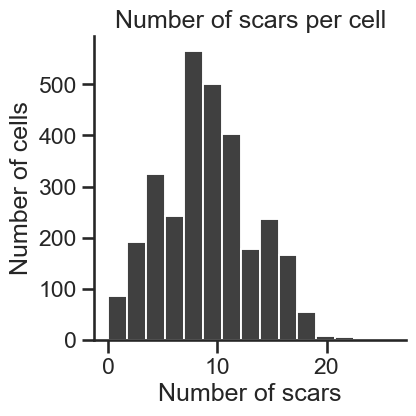

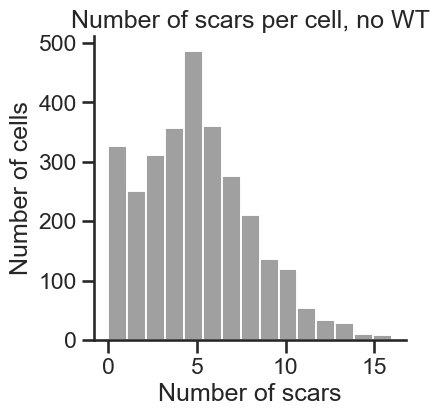

In [16]:
plotAllAlleleCounts(all_allelecounts, bins = 15)
plotAllAlleleCounts(all_allelecounts_noWT, bins=15,color='grey', title = 'Number of scars per cell, no WT')

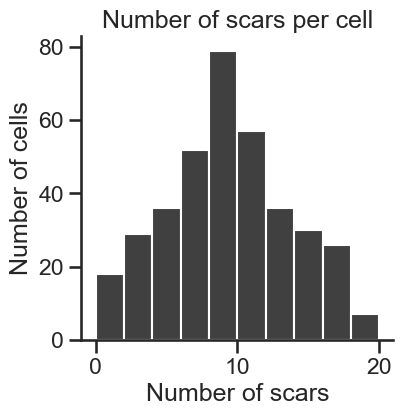

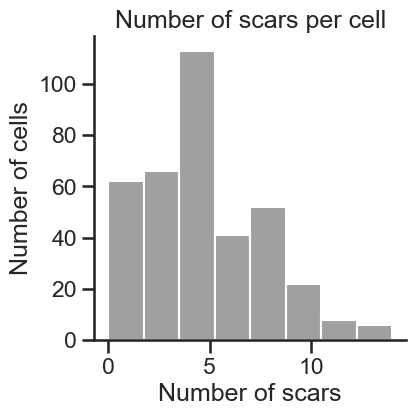

In [17]:
plotAllAlleleCounts(all_allelecounts.loc['C5F10'], bins = 10)
plotAllAlleleCounts(all_allelecounts_noWT.loc['C5F10'], bins=8,color='grey')

In [18]:
#this filters out cells with less than n counts
filtered_all_allelecounts = collections.defaultdict(dict)
for cell in all_allelecounts.index:
    if all_allelecounts.loc[cell].sum() > 2:
        filtered_all_allelecounts[cell] = all_allelecounts.loc[cell]
filtered_all_allelecountsPD = pd.DataFrame.from_dict(filtered_all_allelecounts).transpose()

filter_allelecountsC5A9 = filtered_all_allelecountsPD.loc['C5A9'].fillna(0)
filter_allelecountsC5B10 = filtered_all_allelecountsPD.loc['C5B10'].fillna(0)
filter_allelecountsC5C6 = filtered_all_allelecountsPD.loc['C5C6'].fillna(0)
filter_allelecountsC5F10 = filtered_all_allelecountsPD.loc['C5F10'].fillna(0)
filter_allelecountsC5G7 = filtered_all_allelecountsPD.loc['C5G7'].fillna(0)
filter_allelecountsC5H11 = filtered_all_allelecountsPD.loc['C5H11'].fillna(0)
filter_allelecountsC5H7 = filtered_all_allelecountsPD.loc['C5H7'].fillna(0)
filter_allelecountsC5H9 = filtered_all_allelecountsPD.loc['C5H9'].fillna(0)
filter_all_allelecounts = filtered_all_allelecountsPD.fillna(0).transpose()

# Distance matrix for all gastruloids

distanceMatrix automatically returns the figure of the clustering. In addition, when saying x = distanceMatrix(dataframe), it assigns the output (distance) matrix df to x. This can later be used for clustering the data into groups.

In [19]:
def distanceMatrix(filteredDF,figsize=(15,15),heatmapTitle=''):
    rawMatrix = filteredDF.values 
    rawMatrix = rawMatrix[:, np.logical_and( 
        np.sum(rawMatrix==0,axis=0)>0,
        np.sum(rawMatrix==1,axis=0)>0)]
    pOnes = []
    pZeros = []
    for i in range(rawMatrix.shape[1]):
    # Weights:
        column = rawMatrix[:,i]
        pOnes.append( -np.log2( ( np.sum(column==1)/len(column) )**2 ) ) #probability of two cells both having sSNV
        pZeros.append( -np.log2( ( np.sum(column==0)/len(column) )**2 ) )#probability of two cells not having sSNV,  (and we know it)
    pOnes = np.array(pOnes)
    pZeros = np.array(pZeros)
    
    print( np.sum( np.logical_not(np.isfinite(pZeros)) ),  np.sum((np.isfinite(pZeros))))
    print( np.sum( np.logical_not(np.isfinite(pOnes)) ),  np.sum((np.isfinite(pOnes))))
    print(rawMatrix.shape)
    
    jointMatrix = np.zeros( (rawMatrix.shape[0], rawMatrix.shape[0]) )
    simMatrix =  np.zeros( (rawMatrix.shape[0], rawMatrix.shape[0]) )
    differenceMatrix =  np.zeros( (rawMatrix.shape[0], rawMatrix.shape[0]) )

    for cai in range(rawMatrix.shape[0]):
        for cbi in range(rawMatrix.shape[0]):
            
        
                # Un normalized distance
            pairwiseUnnormalizedDistance = np.logical_and( rawMatrix[cai,:]==1, rawMatrix[cbi,:]==0 ) * \
            (pOnes + pZeros) + \
            np.logical_and( rawMatrix[cai,:]==0, rawMatrix[cbi,:]==1 ) * (pZeros + pOnes) # For different batches the pOnes/pZeros is batch depended

                # Normalize the distance:
            normalisationFactor = np.sum( pOnes* (rawMatrix[cai,:]==1)) + np.sum( pZeros*(rawMatrix[cai,:]==0)) + \
            np.sum( pOnes* (rawMatrix[cbi,:]==1)) + np.sum( pZeros* (rawMatrix[cbi,:]==0))

            pairwiseNormalizedDistance = np.sum(pairwiseUnnormalizedDistance) / (
                        normalisationFactor )
            differenceMatrix[cai, cbi] = pairwiseNormalizedDistance

                # Similarity calculation:
            sim = np.sum( (pOnes+pOnes) * np.logical_and( rawMatrix[cai,:]==1, rawMatrix[cbi,:]==1 )) + \
                      np.sum( (pZeros+pZeros)*np.logical_and( rawMatrix[cai,:]==0, rawMatrix[cbi,:]==0 ))

            normalisedSim = sim/normalisationFactor
            simMatrix[cai, cbi] = normalisedSim

            joinedDistance =  pairwiseNormalizedDistance + (1-normalisedSim )
            jointMatrix[cai,cbi]= joinedDistance


            if cai==cbi:
                break

    normalisedSim, normalisationFactor, sim, rawMatrix[cai,rawMatrix[cai,:]>=0], rawMatrix[cbi,rawMatrix[cbi,:]>=0]
    print(np.where( np.logical_not( np.isfinite( jointMatrix ) ) ))
    #rawMatrix[ np.where( np.logical_not( np.isfinite( jointMatrix ) ) )[0][0] ]
    
    for i in range(jointMatrix.shape[0]):
        for j in range(jointMatrix.shape[0]):
            jointMatrix[j,i]=jointMatrix[i,j]
            if i==j:
                break

    df = pd.DataFrame( np.log(jointMatrix+1), index=filteredDF.index, columns=filteredDF.index )
    x = sns.clustermap( df, vmin=0,vmax=1, figsize=figsize, method='average',metric='euclidean')
    x.fig.suptitle(heatmapTitle)
    x.fig.subplots_adjust(top=0.93)
    #.savefig('heatmapC5F10.png',dpi=300)
    return df
    



## All gastruloids from dataset
 'C5A9', 'C5B10', 'C5C6', 'C5F10',  C5G7', 'C5H11', 'C5H7', 'C5H9'

In [20]:
filteredDF = filter_allelecountsC5F10.copy()

rawMatrix = filteredDF.values 
rawMatrix = rawMatrix[:, np.logical_and( 
    np.sum(rawMatrix==0,axis=0)>0,
    np.sum(rawMatrix==1,axis=0)>0)]
pOnes = []
pZeros = []
for i in range(rawMatrix.shape[1]):
# Weights:
    column = rawMatrix[:,i]
    pOnes.append( -np.log2( ( np.sum(column==1)/len(column) )**2 ) ) #probability of two cells both having sSNV
    pZeros.append( -np.log2( ( np.sum(column==0)/len(column) )**2 ) )#probability of two cells not having sSNV,  (and we know it)
pOnes = np.array(pOnes)
pZeros = np.array(pZeros)

print( np.sum( np.logical_not(np.isfinite(pZeros)) ),  np.sum((np.isfinite(pZeros))))
print( np.sum( np.logical_not(np.isfinite(pOnes)) ),  np.sum((np.isfinite(pOnes))))
print(rawMatrix.shape)

jointMatrix = np.zeros( (rawMatrix.shape[0], rawMatrix.shape[0]) )
simMatrix =  np.zeros( (rawMatrix.shape[0], rawMatrix.shape[0]) )
differenceMatrix =  np.zeros( (rawMatrix.shape[0], rawMatrix.shape[0]) )

for cai in range(rawMatrix.shape[0]):
    for cbi in range(rawMatrix.shape[0]):


            # Un normalized distance
        pairwiseUnnormalizedDistance = np.logical_and( rawMatrix[cai,:]==1, rawMatrix[cbi,:]==0 ) * \
        (pOnes + pZeros) + \
        np.logical_and( rawMatrix[cai,:]==0, rawMatrix[cbi,:]==1 ) * (pZeros + pOnes) # For different batches the pOnes/pZeros is batch depended

            # Normalize the distance:
        normalisationFactor = np.sum( pOnes* (rawMatrix[cai,:]==1)) + np.sum( pZeros*(rawMatrix[cai,:]==0)) + \
        np.sum( pOnes* (rawMatrix[cbi,:]==1)) + np.sum( pZeros* (rawMatrix[cbi,:]==0))

        pairwiseNormalizedDistance = np.sum(pairwiseUnnormalizedDistance) / (
                    normalisationFactor )
        differenceMatrix[cai, cbi] = pairwiseNormalizedDistance

            # Similarity calculation:
        sim = np.sum( (pOnes+pOnes) * np.logical_and( rawMatrix[cai,:]==1, rawMatrix[cbi,:]==1 )) + \
                  np.sum( (pZeros+pZeros)*np.logical_and( rawMatrix[cai,:]==0, rawMatrix[cbi,:]==0 ))

        normalisedSim = sim/normalisationFactor
        simMatrix[cai, cbi] = normalisedSim

        joinedDistance =  pairwiseNormalizedDistance + (1-normalisedSim )
        jointMatrix[cai,cbi]= joinedDistance


        if cai==cbi:
            break

normalisedSim, normalisationFactor, sim, rawMatrix[cai,rawMatrix[cai,:]>=0], rawMatrix[cbi,rawMatrix[cbi,:]>=0]
print(np.where( np.logical_not( np.isfinite( jointMatrix ) ) ))
#rawMatrix[ np.where( np.logical_not( np.isfinite( jointMatrix ) ) )[0][0] ]

for i in range(jointMatrix.shape[0]):
    for j in range(jointMatrix.shape[0]):
        jointMatrix[j,i]=jointMatrix[i,j]
        if i==j:
            break

df = pd.DataFrame( np.log(jointMatrix+1), index=filteredDF.index, columns=filteredDF.index )

0 101
0 101
(338, 101)
(array([], dtype=int64), array([], dtype=int64))


In [21]:
import seaborn as sns; sns.set_theme(color_codes=True)

iris = sns.load_dataset("iris")

species = iris.pop("species")
lut = dict(zip(species.unique(), "rbg"))

row_colors = species.map(lut)

In [22]:
cells_clusters = pd.read_csv('/Users/m.blotenburg/Desktop/scanpy_cells_louvainclusters_colors120hAA.csv', index_col = 0)
cells_clusters

,index,louvain,umap_V1,umap_V2,cellname.1,gastruloid,louvain_colors,germlayer_colors
cellname,,,,,,,,
A1_1,A1_1.C5A4,Early endoderm1,0.168446,-3.569604,A1_1,C5A4,orange,blue
A1_10,A1_10.C5C3,Early endoderm1,1.129176,-4.579352,A1_10,C5C3,orange,blue
A1_100,A1_100.C5C3,Early endoderm2,4.106470,-4.697111,A1_100,C5C3,orange,blue
A1_102,A1_102.C5C3,Neurons1,-0.229431,3.547628,A1_102,C5C3,green,green
A1_103,A1_103.C5C3,Early endoderm2,2.677049,-3.243759,A1_103,C5C3,orange,blue
...,...,...,...,...,...,...,...,...
H2_95,H2_95.C5F10,Neurons2,-0.927874,6.530355,H2_95,C5F10,green,green
H2_96,H2_96.C5F10,Allantois (?),-5.550917,-0.551138,H2_96,C5F10,pink,red
H2_97,H2_97.C5F10,Early endoderm2,1.755302,-4.459294,H2_97,C5F10,orange,blue


In [23]:
colors = pd.merge(df,cells_clusters[cells_clusters['gastruloid'] == 'C5F10']['louvain_colors'],left_index = True,
         right_index= True, how = 'left')['louvain_colors'].fillna('lightgrey')
#colors

/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


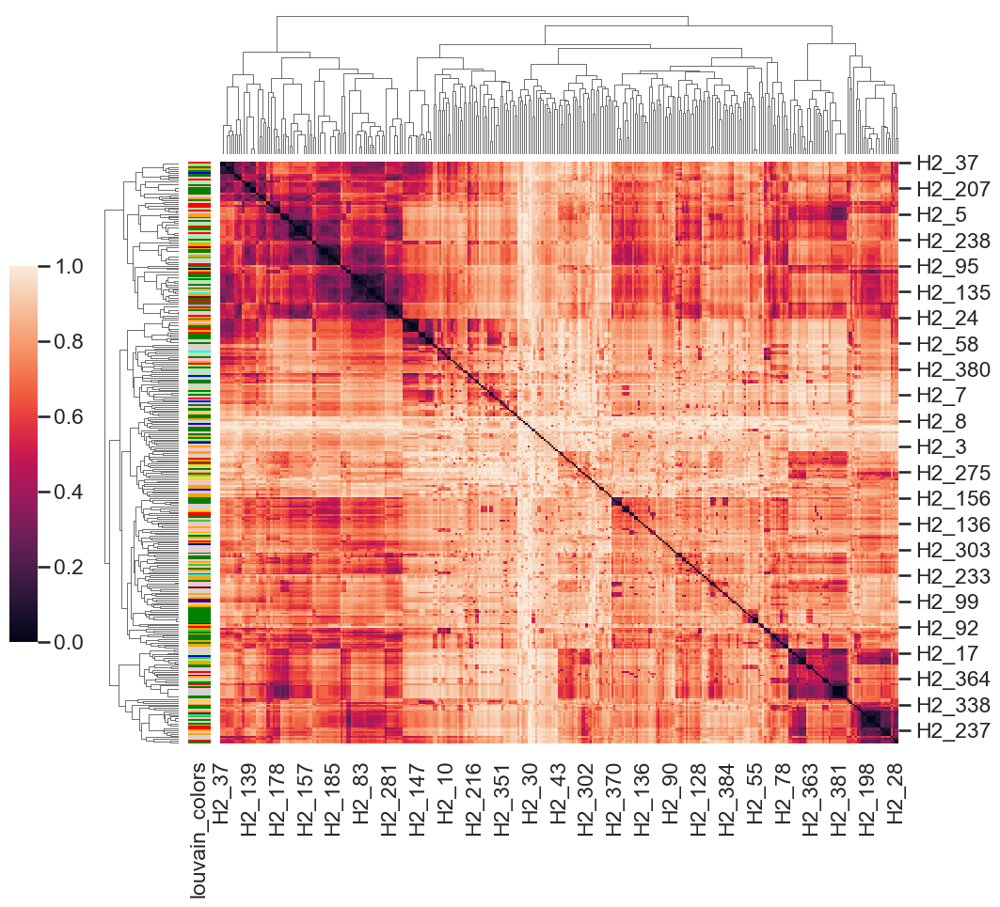

In [24]:
sns.set_context('talk')
sns.set_style('white')
x = sns.clustermap( df, vmin=0,vmax=1, figsize=(10,10), method='average',
                   metric='euclidean', dendrogram_ratio=(.1, .2),
                   cbar_pos=(-0.07, .3, .03, .4), row_colors = colors)
#x.fig.suptitle(heatmapTitle)
#x.fig.subplots_adjust(top=0.8)

0 80
0 80
(242, 80)
(array([], dtype=int64), array([], dtype=int64))


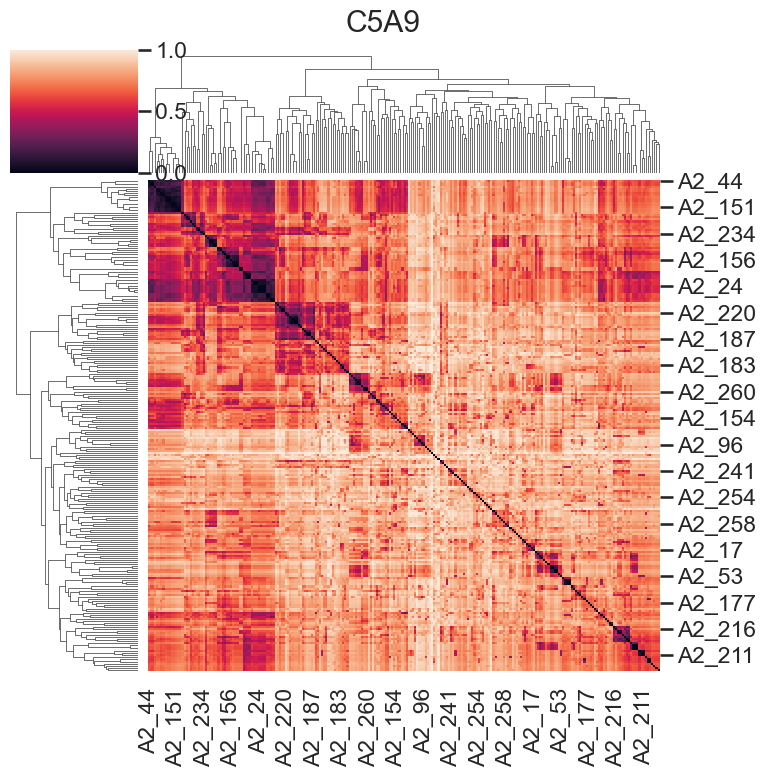

In [25]:
dmC5A9 = distanceMatrix(filter_allelecountsC5A9, figsize = (8,8), heatmapTitle='C5A9')

0 91
0 91
(320, 91)
(array([], dtype=int64), array([], dtype=int64))


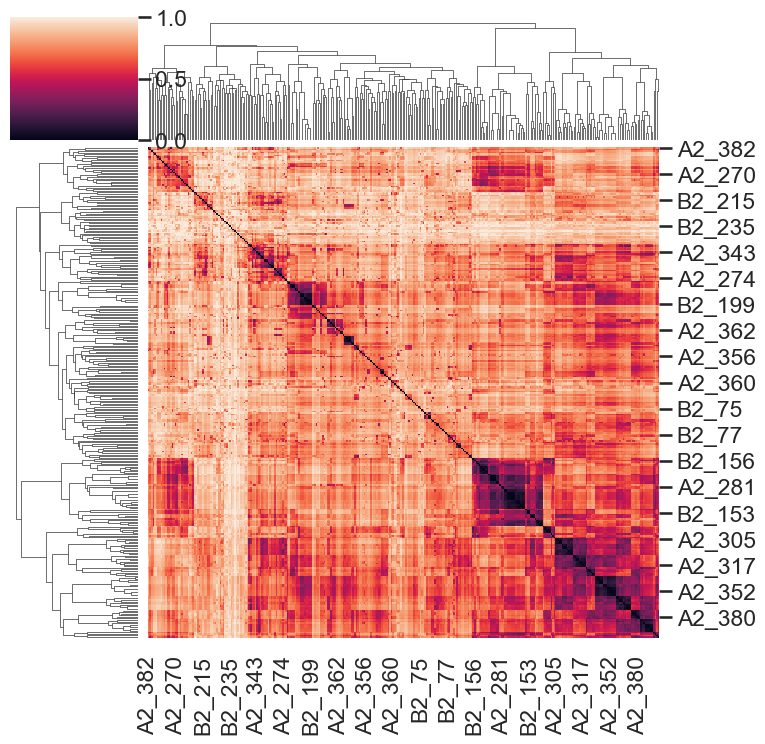

In [26]:
dmC5B10 = distanceMatrix(filter_allelecountsC5B10, figsize = (8,8))

0 110
0 110
(298, 110)
(array([], dtype=int64), array([], dtype=int64))


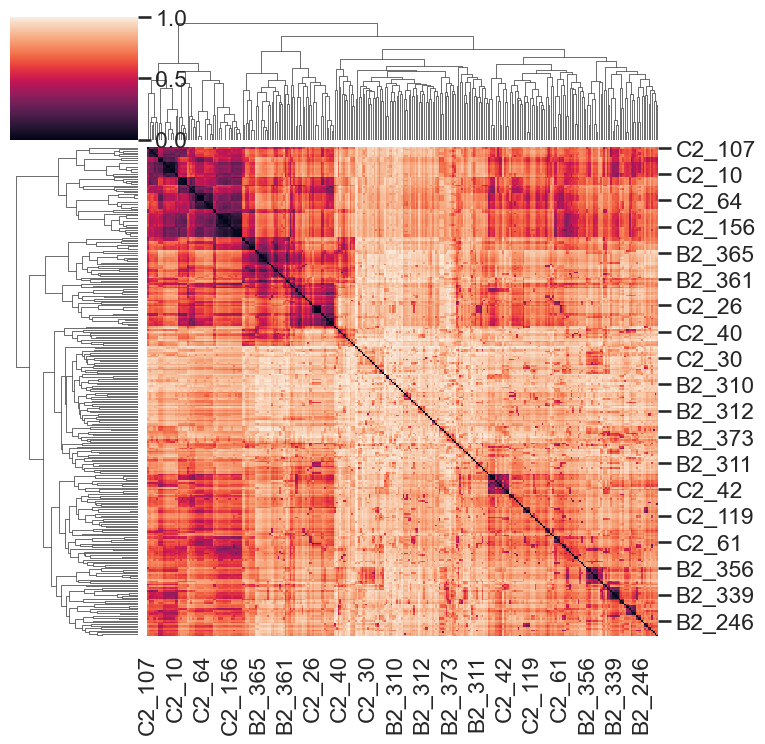

In [27]:
dmC5C6 = distanceMatrix(filter_allelecountsC5C6, figsize = (8,8))

0 101
0 101
(338, 101)
(array([], dtype=int64), array([], dtype=int64))


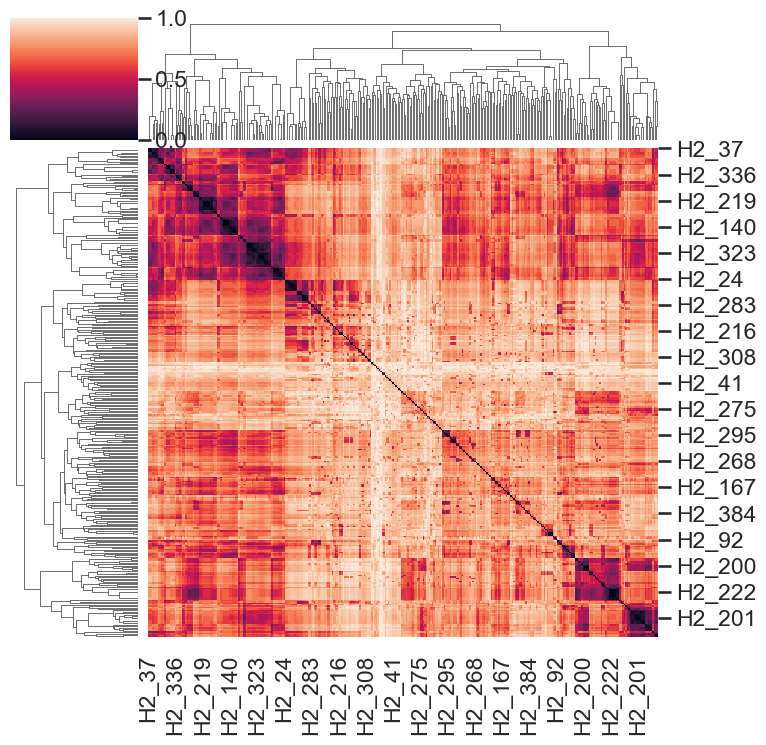

In [28]:
dmC5F10 = distanceMatrix(filter_allelecountsC5F10, figsize = (8,8))

0 114
0 114
(480, 114)
(array([], dtype=int64), array([], dtype=int64))


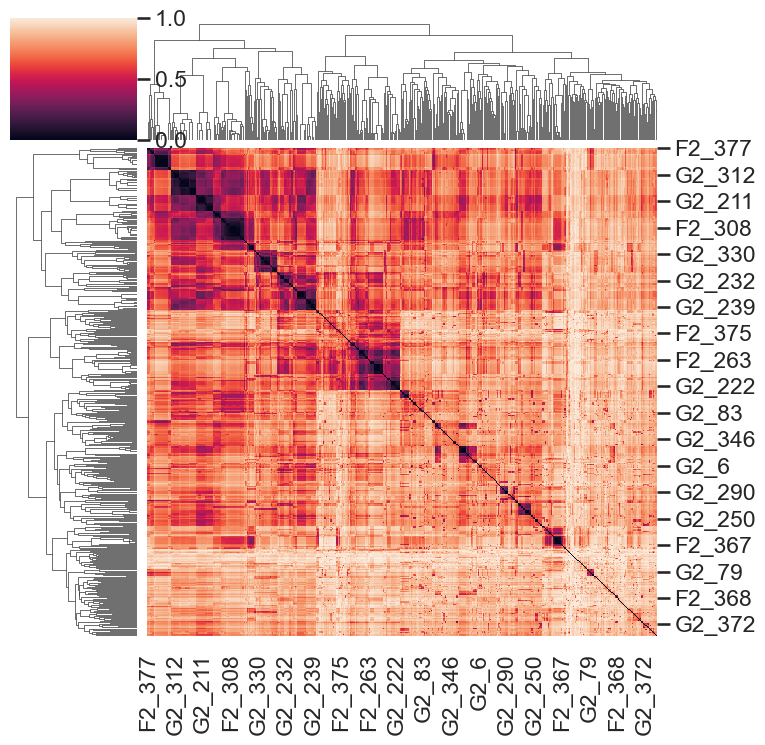

In [29]:
dmC5G7 = distanceMatrix(filter_allelecountsC5G7, figsize = (8,8))

0 102
0 102
(450, 102)
(array([], dtype=int64), array([], dtype=int64))


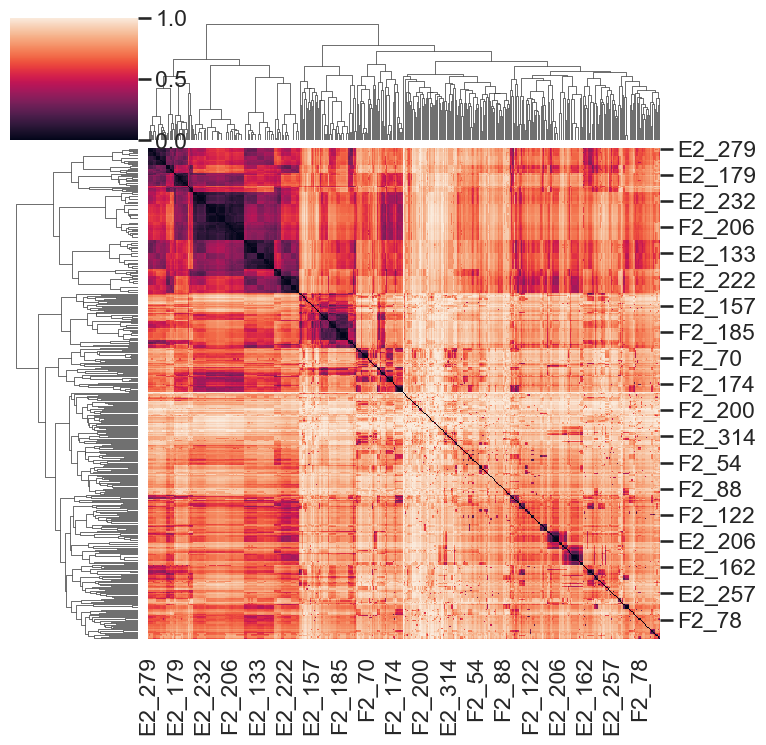

In [30]:
dmC5H11 = distanceMatrix(filter_allelecountsC5H11, figsize = (8,8))

0 91
0 91
(340, 91)
(array([], dtype=int64), array([], dtype=int64))


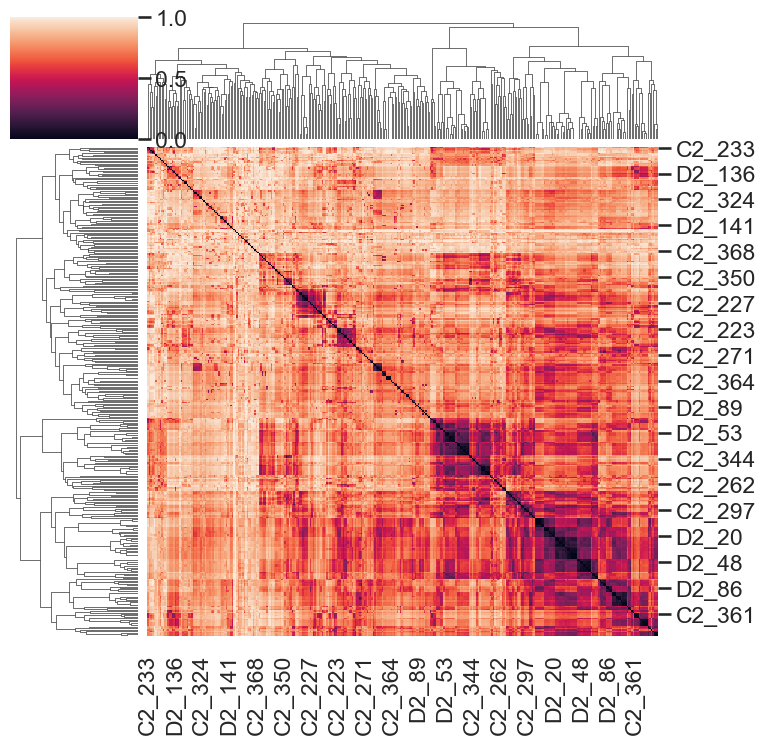

In [31]:
dmC5H7 = distanceMatrix(filter_allelecountsC5H7, figsize = (8,8))

0 94
0 94
(307, 94)
(array([], dtype=int64), array([], dtype=int64))


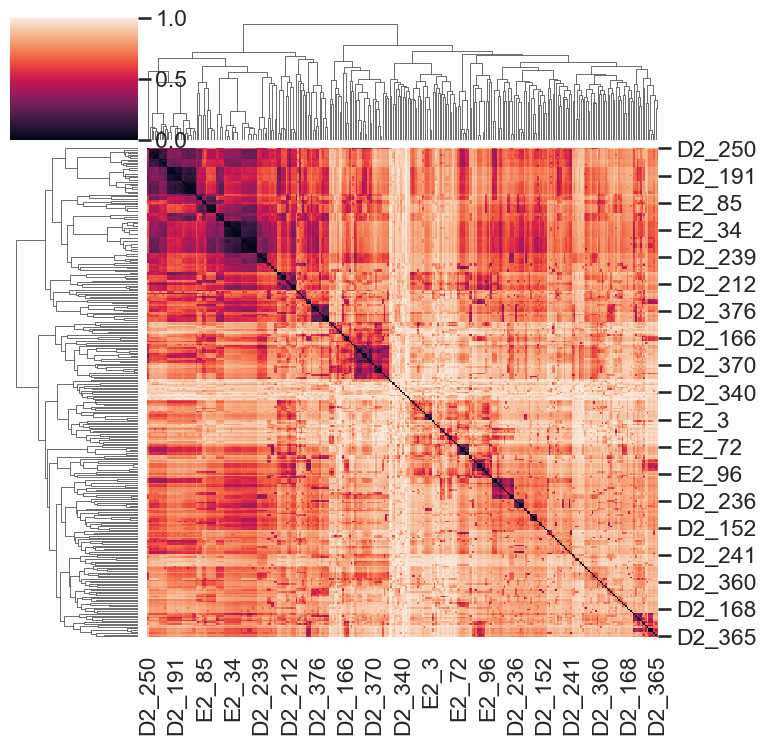

In [32]:
dmC5H9 = distanceMatrix(filter_allelecountsC5H9, figsize = (8,8))

In [33]:
all_allelecounts_fordistancecalc.columns.levels[0]

Index(['C5A9', 'C5B10', 'C5C6', 'C5F10', 'C5G7', 'C5H11', 'C5H7', 'C5H9'], dtype='object')

## Clustering based on computed distance matrix.

In [34]:
def scipyClustering(df, gastruloidName = '', clusterNumber = 20):
    x = scipy.cluster.hierarchy.linkage(df.fillna(0),'ward')
    clusters = scipy.cluster.hierarchy.cut_tree(x, n_clusters= (clusterNumber))
    clust = pd.DataFrame.from_dict({cellName:{('clust_' + gastruloidName):clusters[cellIndex][0]} for cellIndex,cellName in enumerate(df.index)}).transpose()
    return clust

In [35]:
C5F10_clust = scipyClustering(dmC5F10, gastruloidName = 'C5F10',  clusterNumber = (len(dmC5F10)/10))

In [36]:
C5A9_clust = scipyClustering(dmC5A9, gastruloidName = 'C5A9',  clusterNumber = (len(dmC5A9)/10))

In [37]:
C5B10_clust = scipyClustering(dmC5B10, gastruloidName = 'C5B10',  clusterNumber = (len(dmC5B10)/10))

In [38]:
C5C6_clust = scipyClustering(dmC5C6, gastruloidName = 'C5C6',  clusterNumber = (len(dmC5C6)/10))

In [39]:
C5G7_clust = scipyClustering(dmC5G7, gastruloidName = 'C5G7',  clusterNumber = (len(dmC5G7)/10))

In [40]:
C5H11_clust = scipyClustering(dmC5H11, gastruloidName = 'C5H11',  clusterNumber = (len(dmC5H11)/10))

In [41]:
C5H7_clust = scipyClustering(dmC5H7, gastruloidName = 'C5H7',  clusterNumber = (len(dmC5H7)/10))

In [42]:
C5H9_clust = scipyClustering(dmC5H9, gastruloidName = 'C5H9',  clusterNumber = (len(dmC5H9)/10))

# For tsne plots

In [43]:
umap =  pd.read_csv('/Users/m.blotenburg/Desktop/scanpy_cells_louvainclusters_colors120hAA.csv')
umap['gastruloid'] = umap['index'].str.split('.',expand=True)[1]
umap.index = umap['cellname']
umap.head()

,cellname,index,louvain,umap_V1,umap_V2,cellname.1,gastruloid,louvain_colors,germlayer_colors
cellname,,,,,,,,,
A1_1,A1_1,A1_1.C5A4,Early endoderm1,0.168446,-3.569604,A1_1,C5A4,orange,blue
A1_10,A1_10,A1_10.C5C3,Early endoderm1,1.129176,-4.579352,A1_10,C5C3,orange,blue
A1_100,A1_100,A1_100.C5C3,Early endoderm2,4.106470,-4.697111,A1_100,C5C3,orange,blue
A1_102,A1_102,A1_102.C5C3,Neurons1,-0.229431,3.547628,A1_102,C5C3,green,green
A1_103,A1_103,A1_103.C5C3,Early endoderm2,2.677049,-3.243759,A1_103,C5C3,orange,blue


In [44]:
# add cluster information to tsne dataframe
dfs_all = [umap,C5F10_clust,C5A9_clust,C5B10_clust,C5C6_clust,C5G7_clust,C5H11_clust,C5H7_clust,C5H9_clust]
umap_clust = dfs_all[0].join(dfs_all[1:],how='outer')
umap_clust = umap_clust.rename(index=str, columns = {"umap_V1": "V1", "umap_V2":"V2"})
umap_clust.tail()

,cellname,index,louvain,V1,V2,cellname.1,gastruloid,louvain_colors,germlayer_colors,clust_C5F10,clust_C5A9,clust_C5B10,clust_C5C6,clust_C5G7,clust_C5H11,clust_C5H7,clust_C5H9
E2_42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0
E2_68,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
E2_7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0
E2_94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.0
E2_99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.0


In [45]:
umap['louvain_colors'].unique()

array(['orange', 'green', 'blue', 'cyan', 'pink', 'red', 'gold', 'maroon',
       'palegreen', 'navy', 'limegreen'], dtype=object)

In [46]:
umap['louvain'].unique()

array(['Early endoderm1', 'Early endoderm2', 'Neurons1',
       'Presomitic mesoderm', 'Somitogenesis wavefront', 'Allantois (?)',
       'Early heart progenitors', 'PGCs + Node ', 'Haemogenic', 'Tailbud',
       '?', 'Early somitic',
       'Anterior neural / Neurectoderm + branchial arches', 'Neurons2'],
      dtype=object)

/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


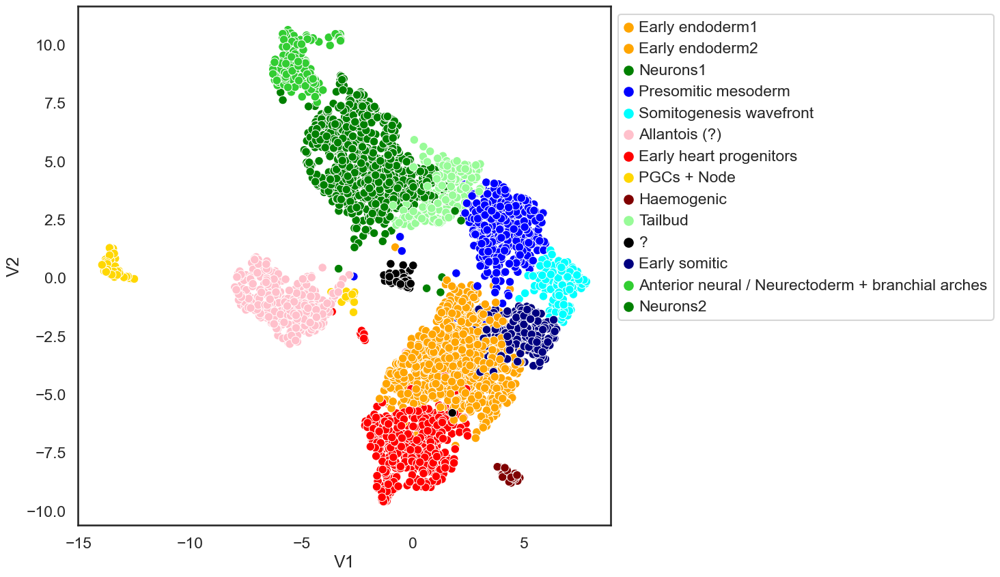

In [47]:
##### tsne with colours from raceid clusters
plt.figure(figsize=(10,10))
fig = sns.scatterplot(umap_clust['V1'], umap_clust['V2'], hue = umap_clust['louvain'], 
                      palette = ['orange','orange', 'green', 'blue', 'cyan', 'pink', 'red', 'gold', 
                                 'maroon','palegreen','black', 'navy', 'limegreen', 'green'] )
fig.legend(bbox_to_anchor=(1,1))
#fig.figure.savefig(pathToSaveData + 'tsne_raceidClusters.png',dpi=300)

## Some definitions for easier plotting

In [48]:
def plotAllScarsonTranscriptomeMap(gastruloid,clusters, tsne_clust = umap_clust):
    plt.figure(figsize=(10,10))
    fig = plt.scatter(tsne_clust['V1'], tsne_clust['V2'],c='lightgrey',edgecolor = 'grey', zorder=10)
    fig = plt.scatter(tsne_clust[tsne_clust['gastruloid'] == gastruloid]['V1'], 
            tsne_clust[tsne_clust['gastruloid'] == gastruloid]['V2'], c = [(0,0,0)],zorder=10,edgecolor = 'grey')
    fig = sns.scatterplot(tsne_clust['V1'], tsne_clust['V2'], hue = tsne_clust[clusters], marker = '*',
                palette='rainbow',legend=False, edgecolor = 'black', s=140, linewidth=0.2, zorder=10)
    plt.title(('All scar clusters for gastruloid ' + str(gastruloid)),fontsize=20)
#fig.figure.savefig(pathToSaveData + 'tsne_clusters/C5F10_TsneAllScars.png', dpi=300)
    
    

In [49]:
def plotPerClusteronTranscriptomeMap(gastruloid, clusters, tsne_clust = umap_clust):
    for clustnr in tsne_clust[clusters].unique():
        if pd.isna(clustnr):
            continue
        plt.figure(figsize=(10,10))
        fig = plt.scatter(tsne_clust['V1'], tsne_clust['V2'],c='lightgrey',edgecolor = 'grey', zorder=10)
        fig = plt.scatter(tsne_clust[tsne_clust['gastruloid'] == gastruloid]['V1'], 
                tsne_clust[tsne_clust['gastruloid'] == gastruloid]['V2'],
                c = [(0,0,0)],zorder=10,edgecolor = 'grey')
        fig = plt.scatter(tsne_clust[tsne_clust[clusters] == clustnr]['V1'], 
                tsne_clust[tsne_clust[clusters] == clustnr]['V2'],
                c = [(1,0,0)], s = 125, marker = '*',zorder=10, edgecolor = 'maroon')
        plt.title('Gastruloid ' + str(gastruloid) + ', cluster ' + str(clustnr),fontsize=20)
        #fig.figure.savefig(pathToSaveData + 'tsne_clusters/C5F10_tsneCluster'+ str(clustnr) + '.png', dpi=300)
        plt.show()
    

### For C5F10

/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


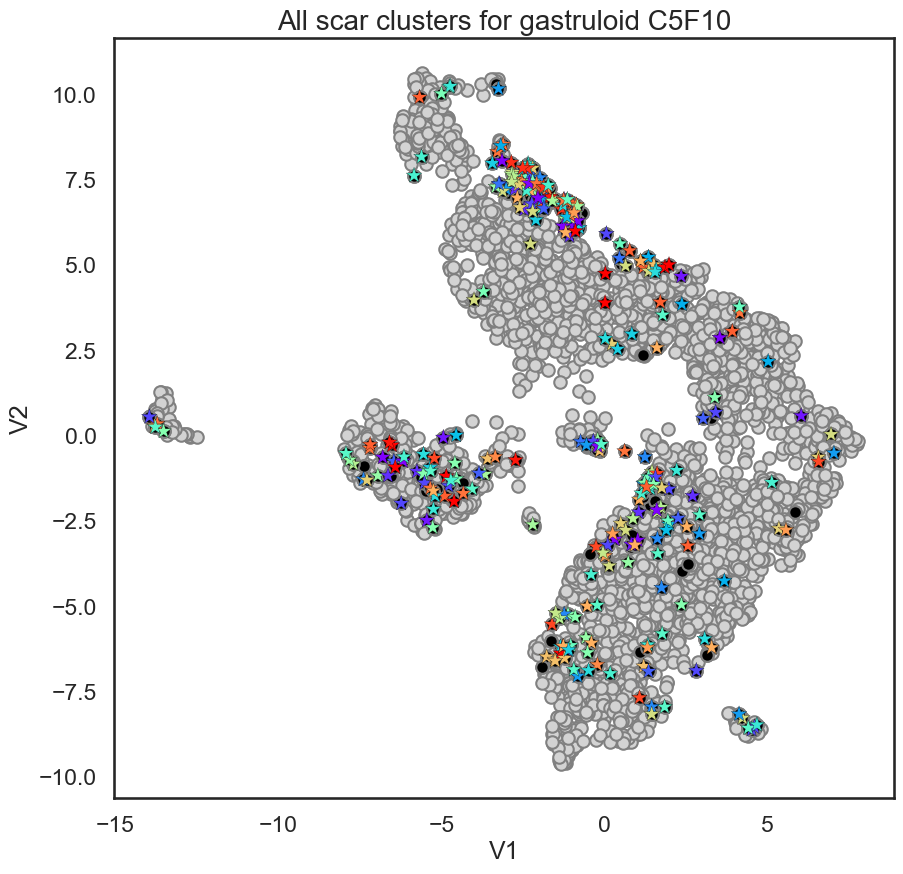

In [50]:
plotAllScarsonTranscriptomeMap('C5F10', 'clust_C5F10')

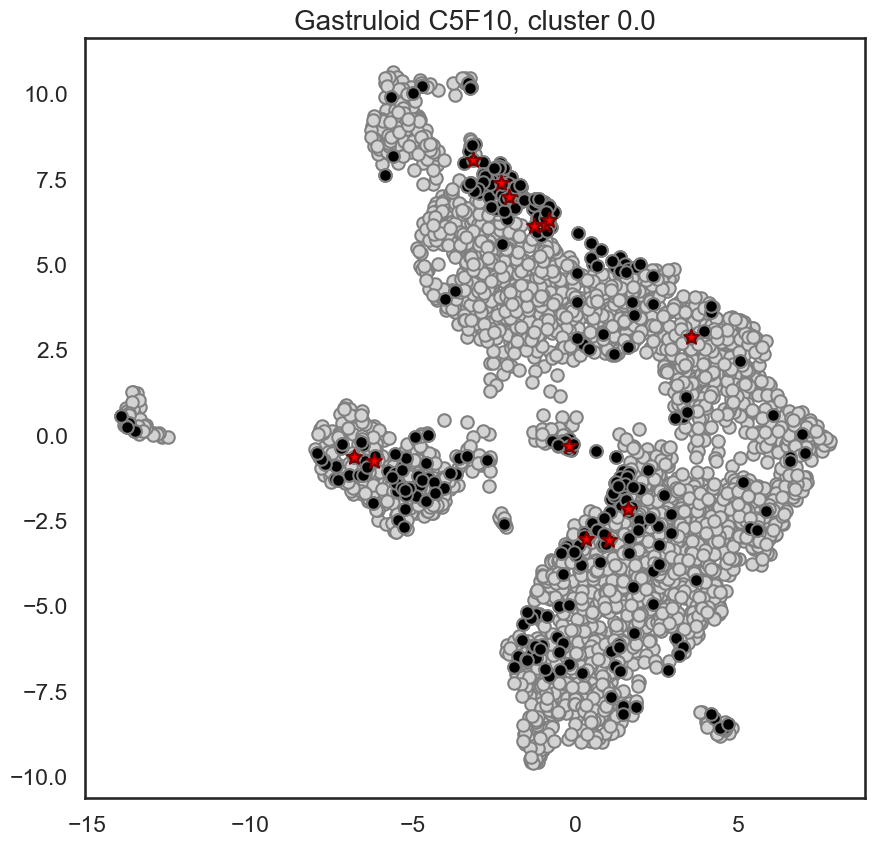

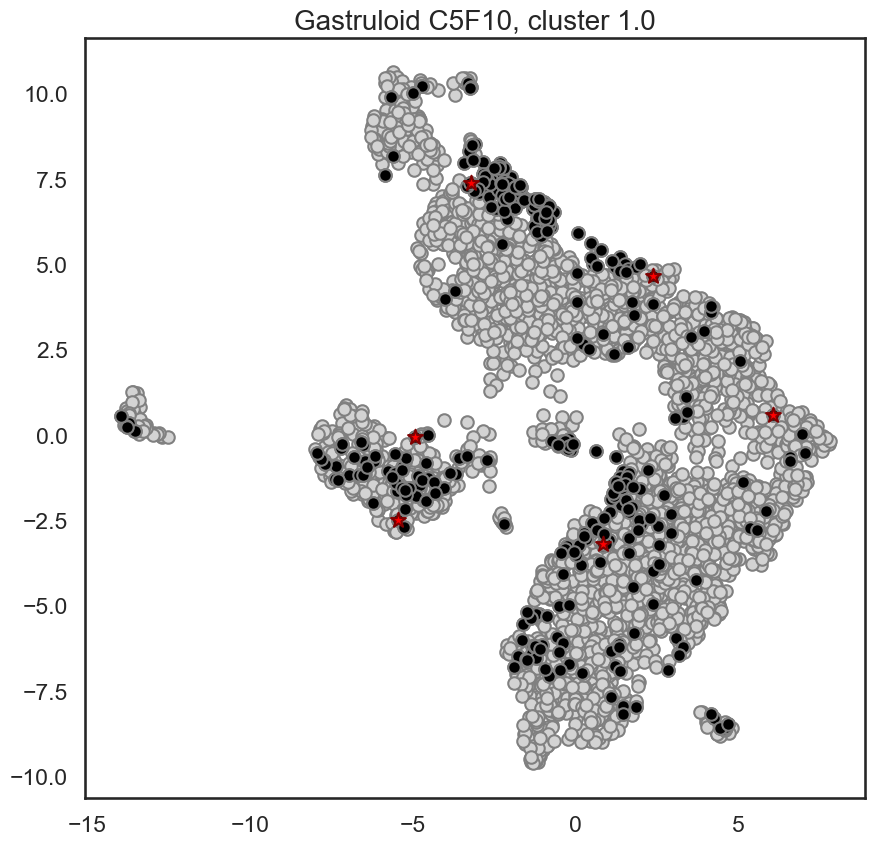

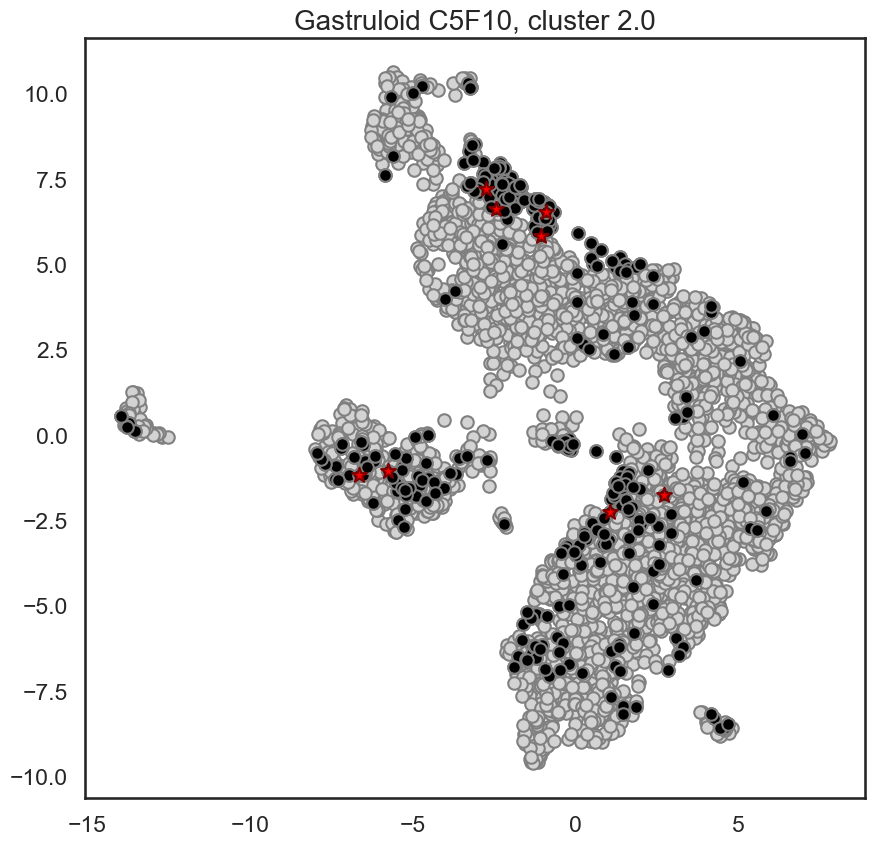

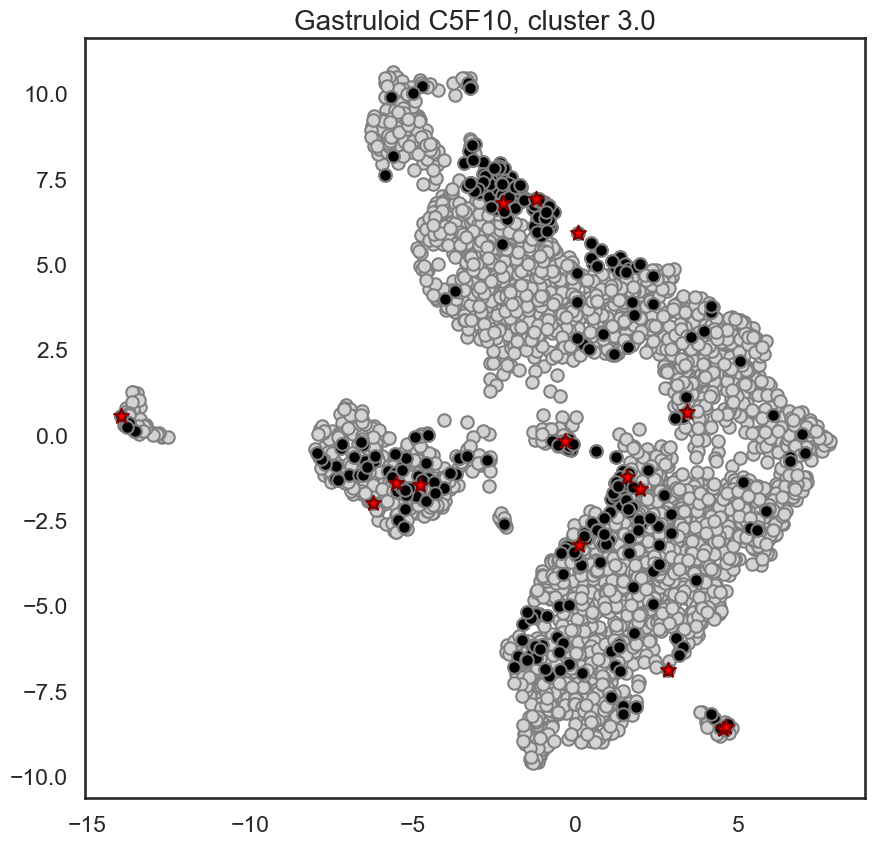

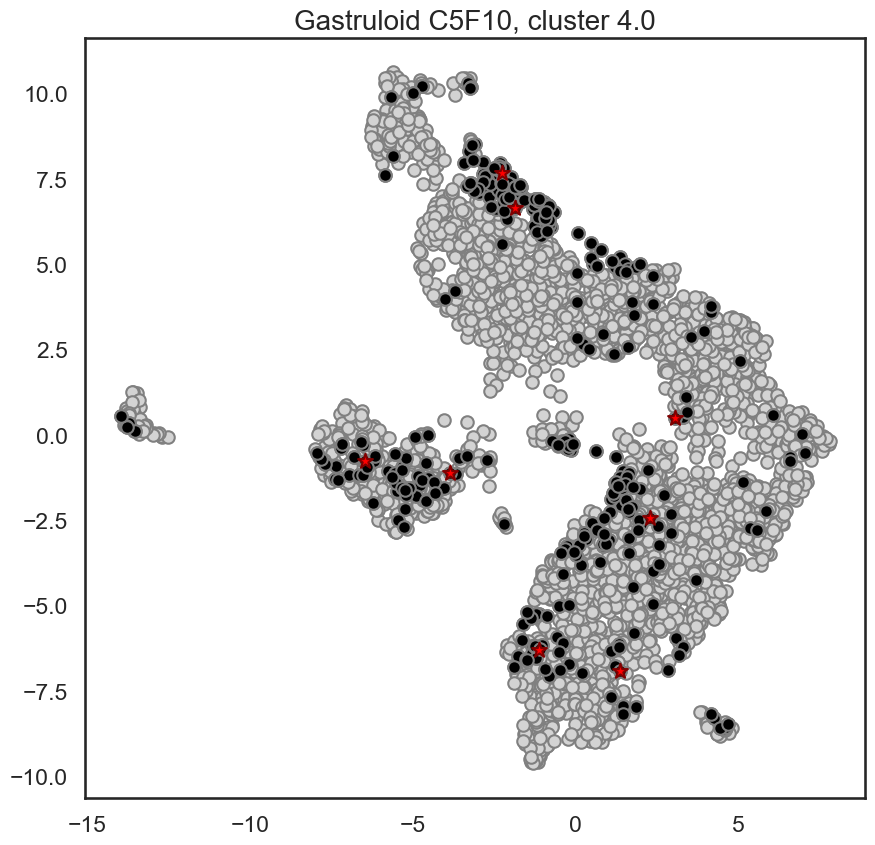

...

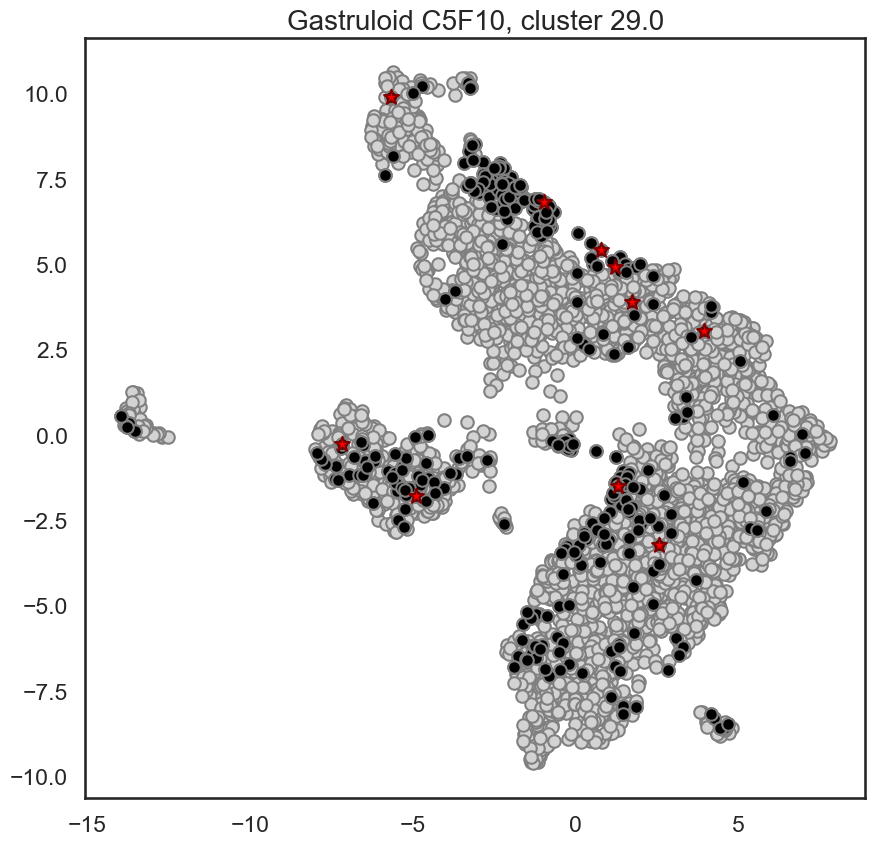

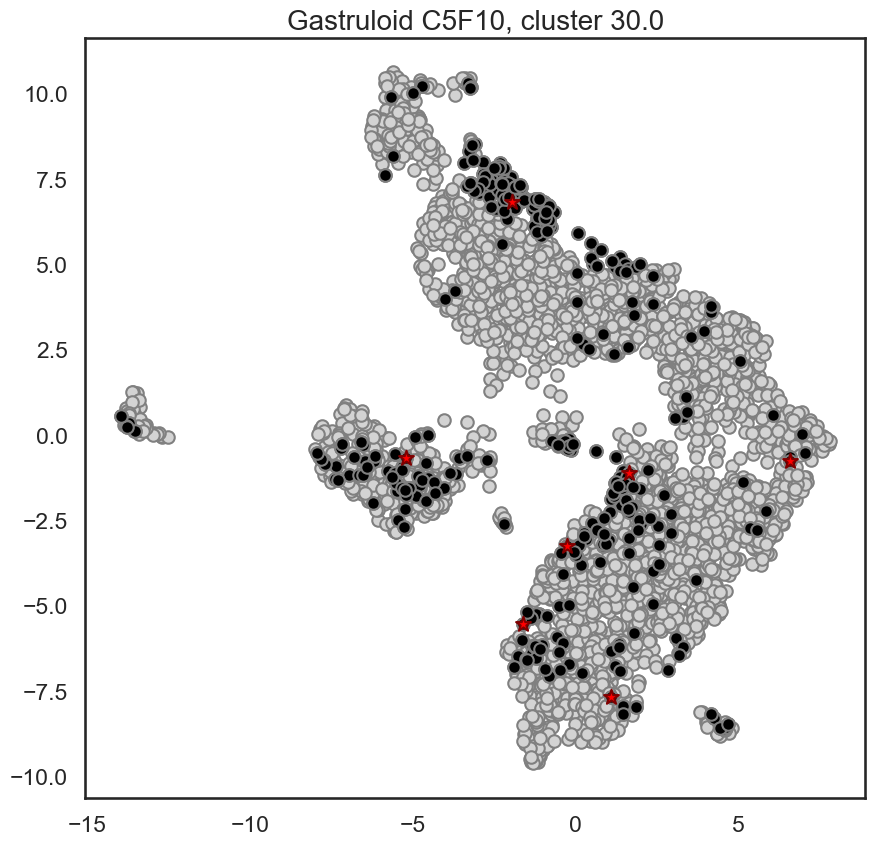

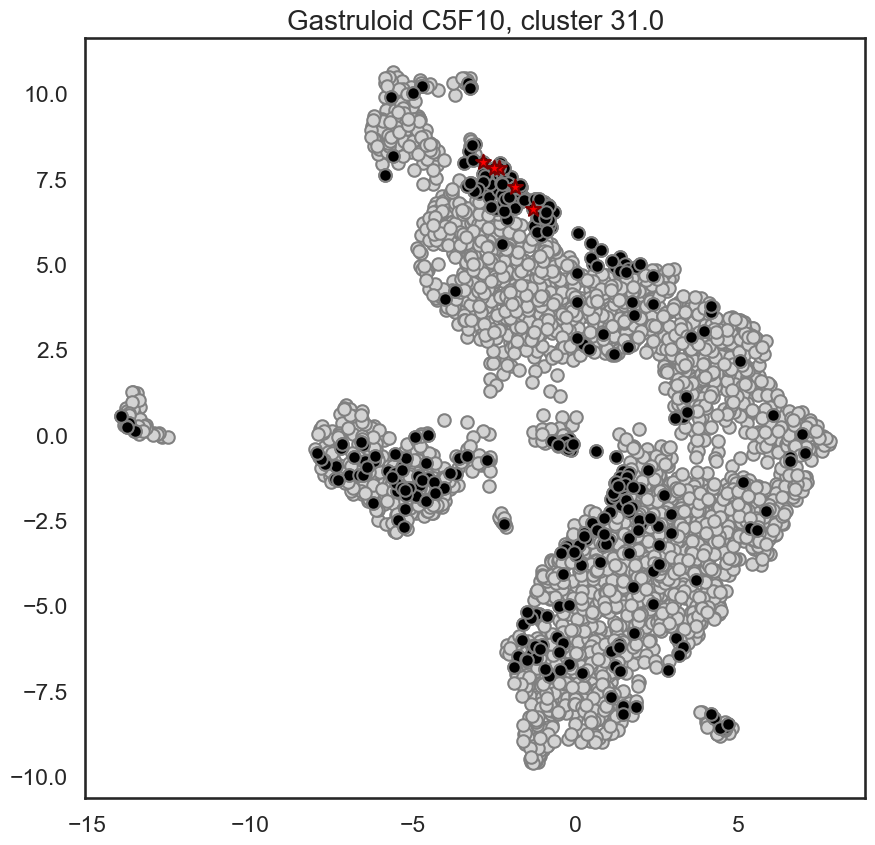

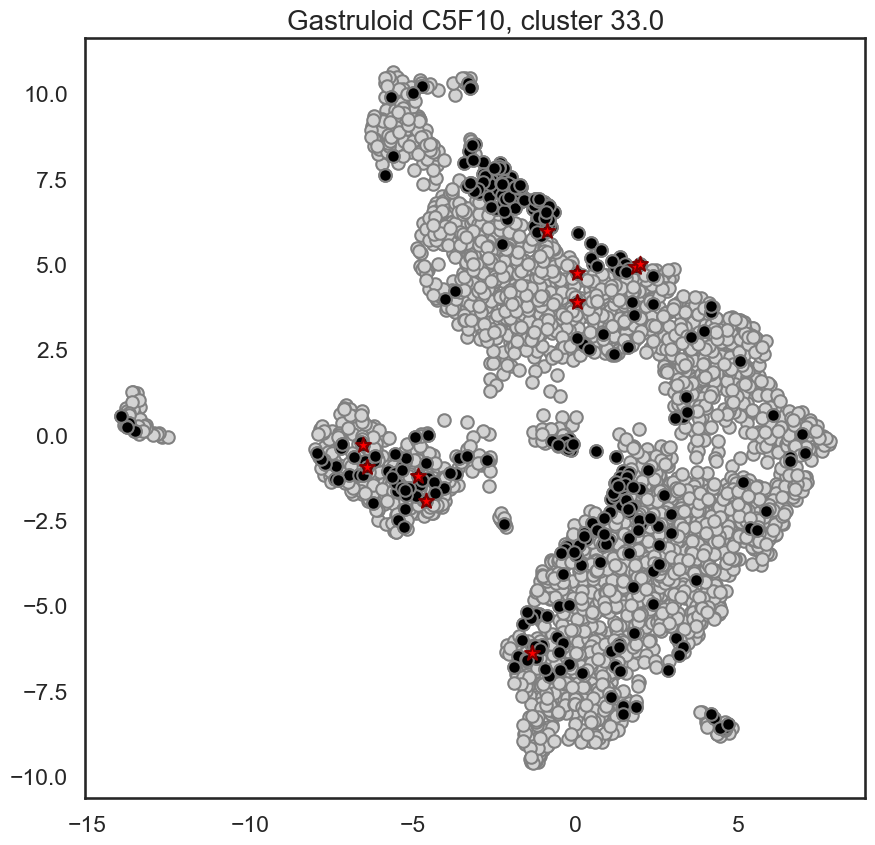

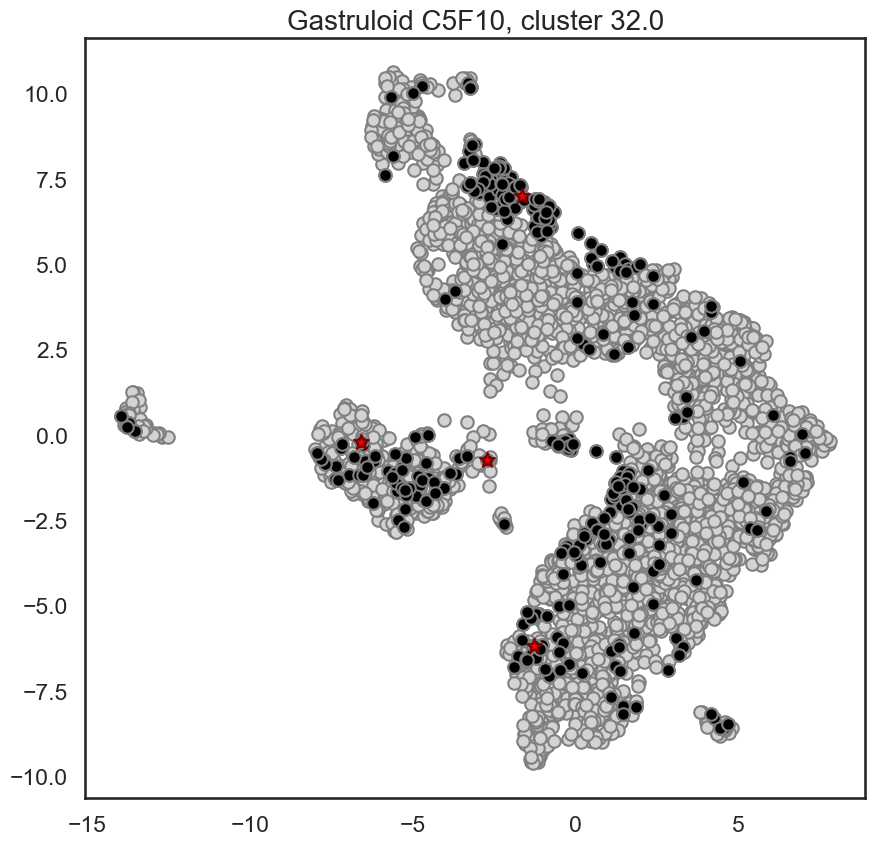

In [51]:
plotPerClusteronTranscriptomeMap('C5F10', 'clust_C5F10')

### For C5A9

/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


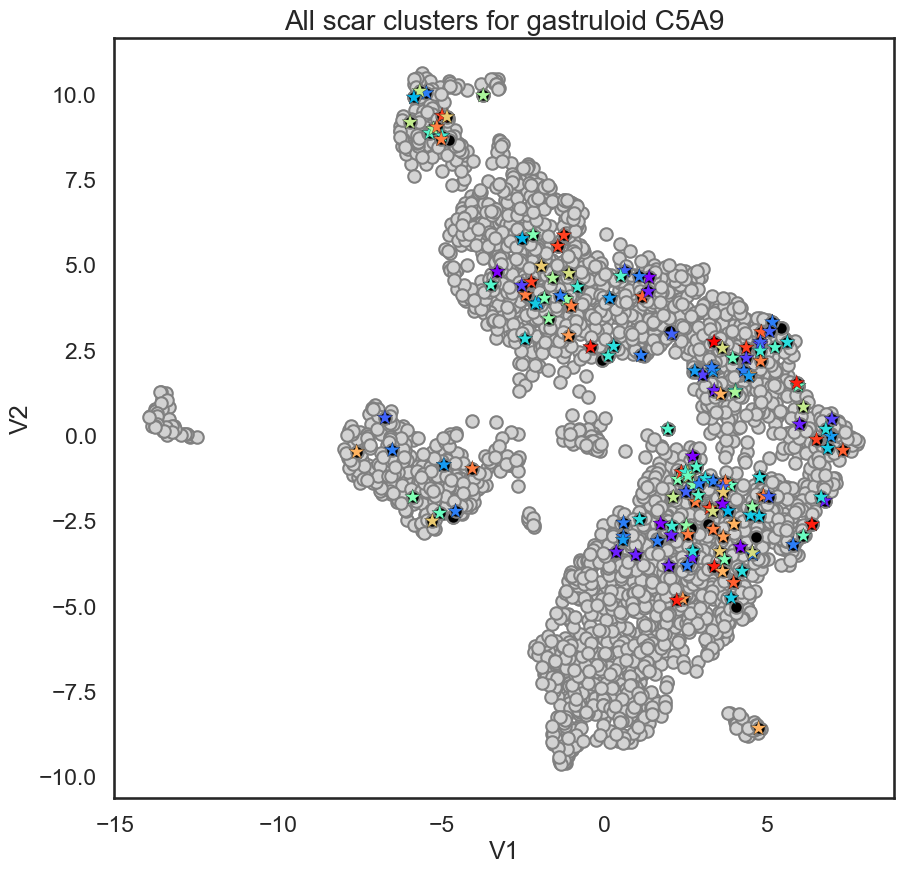

In [52]:
plotAllScarsonTranscriptomeMap('C5A9', 'clust_C5A9')

In [ ]:
plotPerClusteronTranscriptomeMap('C5A9', 'clust_C5A9')

### For C5B10

/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


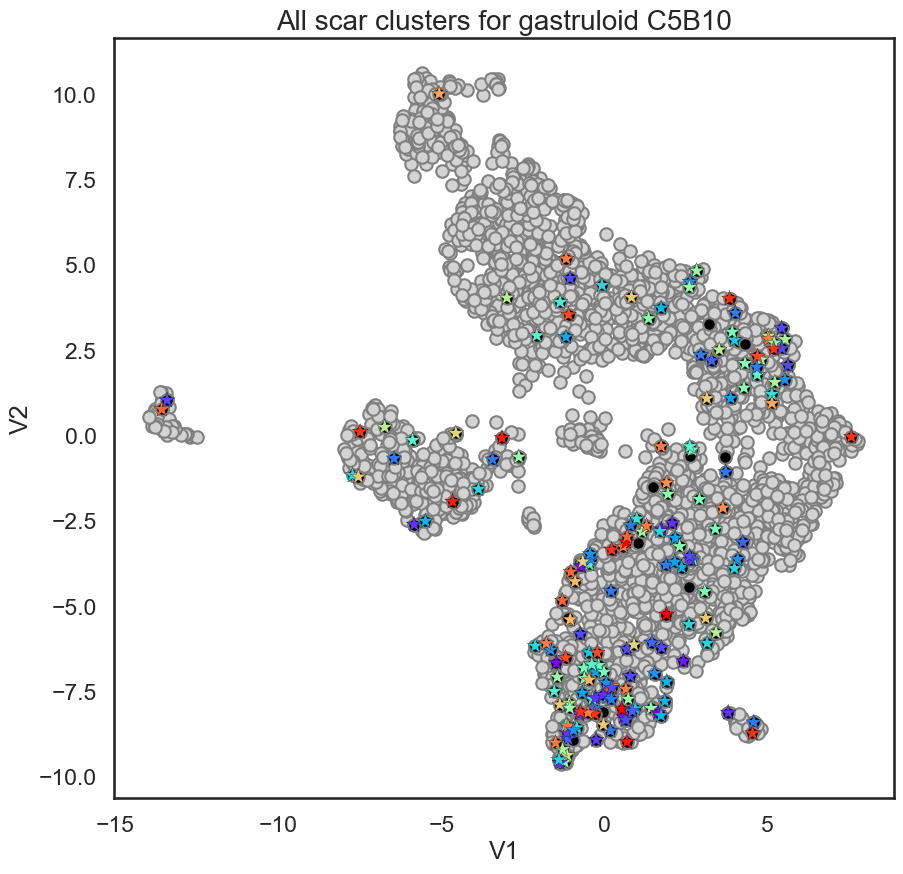

In [53]:
plotAllScarsonTranscriptomeMap('C5B10', 'clust_C5B10')

In [ ]:
plotPerClusteronTranscriptomeMap('C5B10', 'clust_C5B10')

### For C5C6

/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


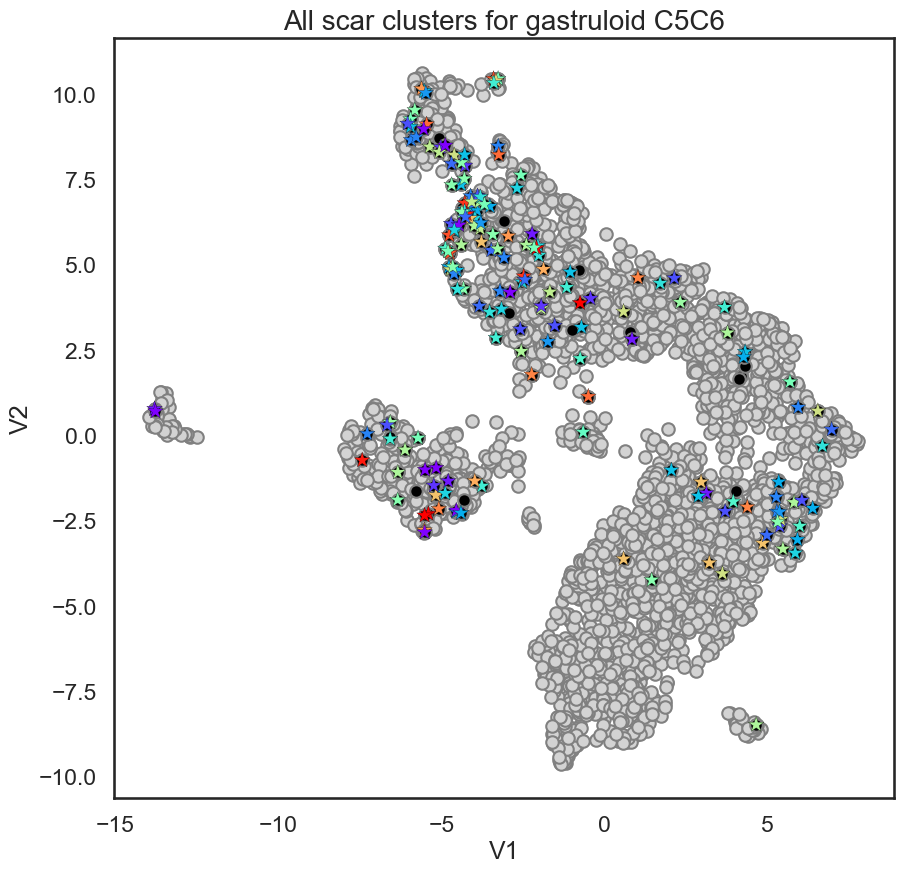

In [54]:
plotAllScarsonTranscriptomeMap('C5C6', 'clust_C5C6')

In [ ]:
plotPerClusteronTranscriptomeMap('C5C6', 'clust_C5C6')

### For C5G7

/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


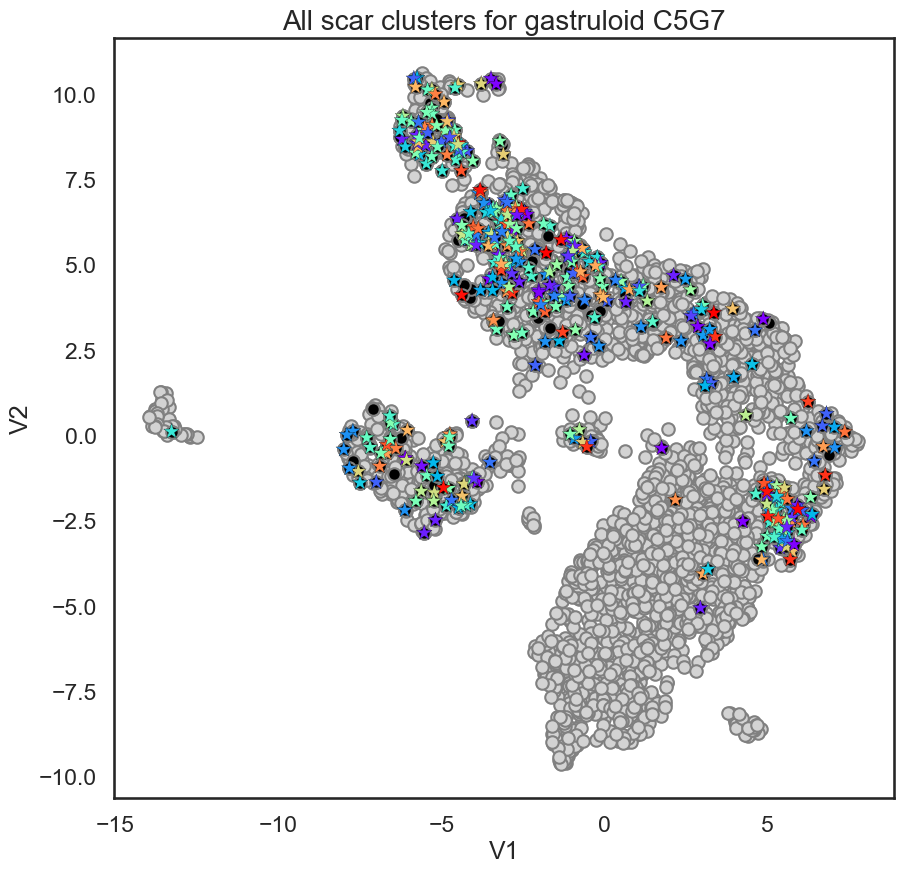

In [55]:
plotAllScarsonTranscriptomeMap('C5G7', 'clust_C5G7')

In [ ]:
plotPerClusteronTranscriptomeMap('C5G7', 'clust_C5G7')

### For C5H11

/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


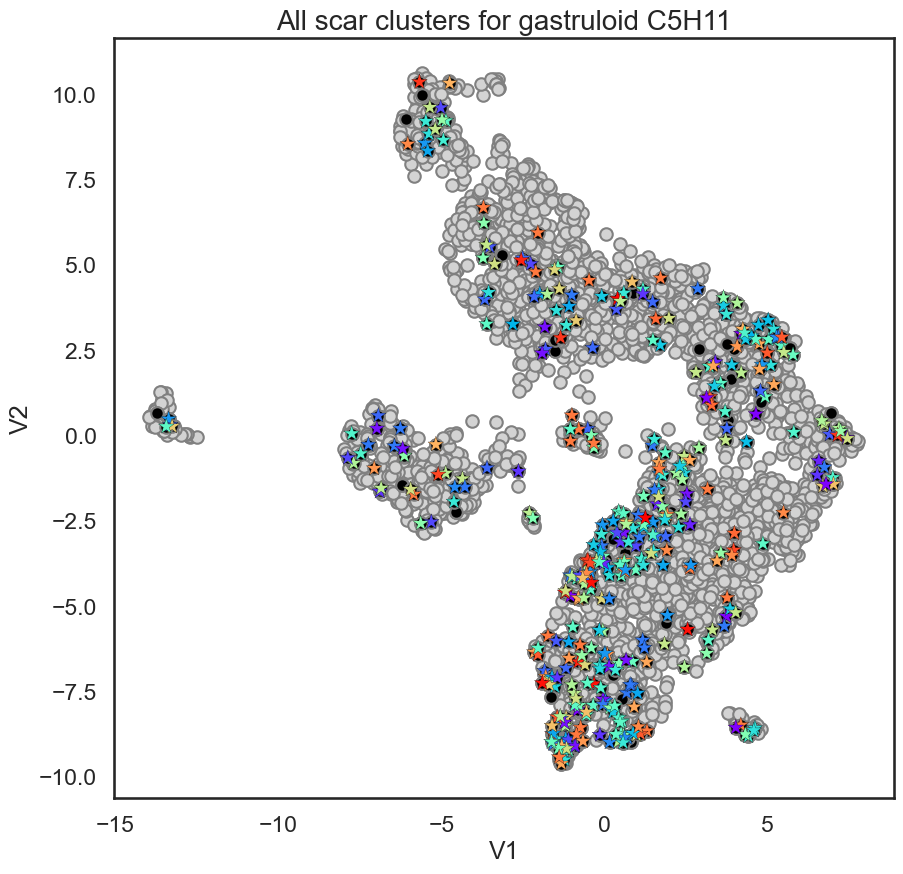

In [56]:
plotAllScarsonTranscriptomeMap('C5H11', 'clust_C5H11')

In [ ]:
plotPerClusteronTranscriptomeMap('C5H11', 'clust_C5H11')

### For C5H7

/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


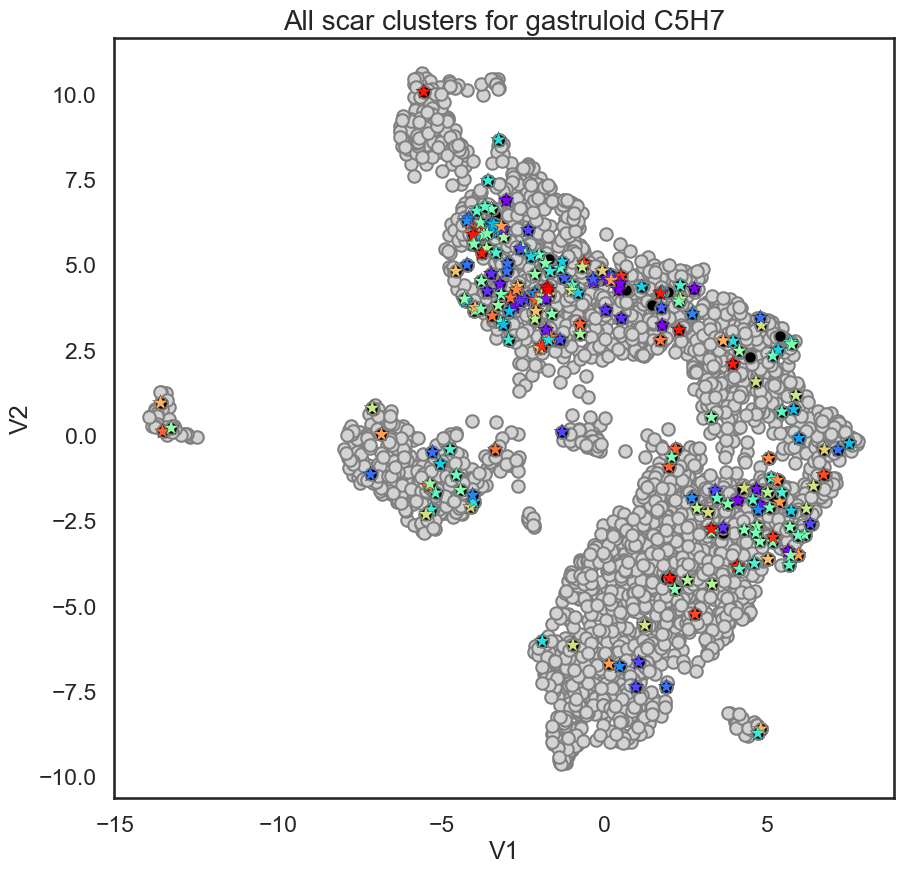

In [57]:
plotAllScarsonTranscriptomeMap('C5H7', 'clust_C5H7')

In [ ]:
plotPerClusteronTranscriptomeMap('C5H7', 'clust_C5H7')

### For C5H9

/Users/m.blotenburg/miniconda3/envs/scanpy2/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


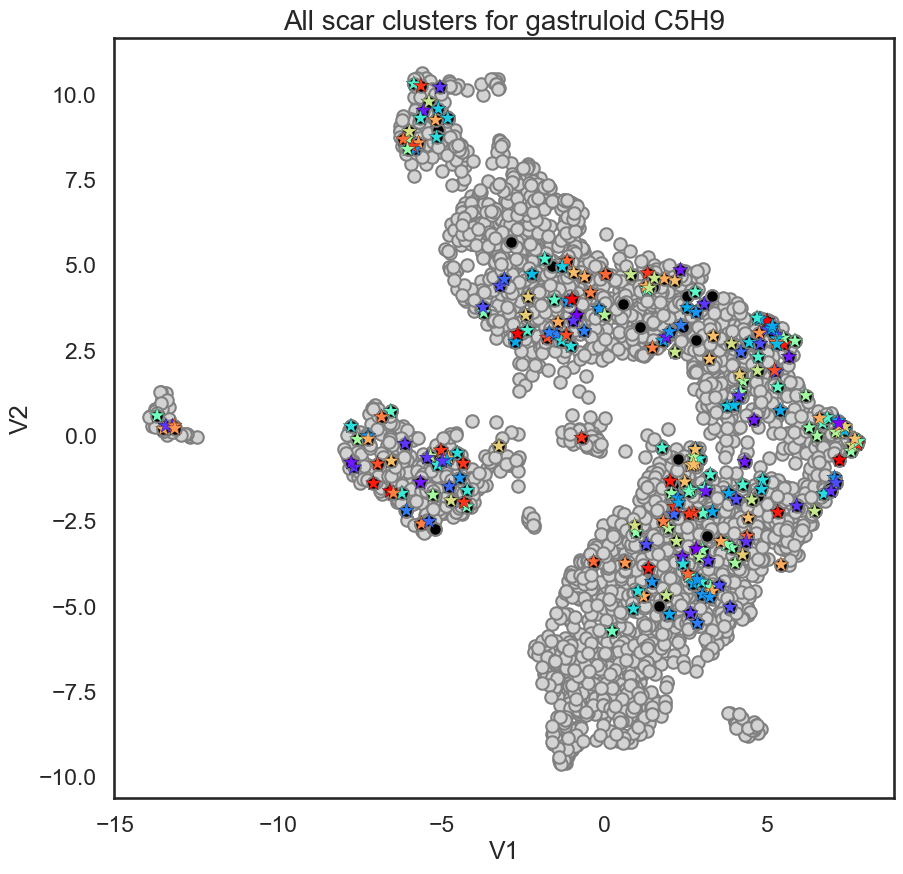

In [58]:
plotAllScarsonTranscriptomeMap('C5H9', 'clust_C5H9')

In [ ]:
plotPerClusteronTranscriptomeMap('C5H9', 'clust_C5H9')